# DM-13687: Exploratory plots from HiTS processing

This notebook originally lived on the lsst-dev server at `/home/mrawls/notebooks/DM-13687.ipynb`, with an html exported version (showing all plots etc.) at `/project/mrawls/DM-13687.html`. A copy of the notebook is being pushed to the `u/mrawls/notebooks-etc` ticket branch of `ap_pipe` for archival sake, as some of the functions and workflows implemented here will likely be useful in the future.


## Ticket Detail

As part of LDM-503-3, we processed 3 fields of HiTS through ap_pipe and ap_verify.  The resulting test report (DM-12534) mostly examined whether the expected products were produced. This ticket is to do some initial scientific validation of the processed data, which is located on lsst-dev at `/scratch/ebellm/ap_verify_HiTS`.

In particular, this may include:
* plotting histograms of the number of DIASources associated with each DIAObject
* calculating the median magnitude and RMS for each DIAObject in one band, and plotting them against each other
* plotting lightcurves for DIAObjects which are outliers on the above plots
* examining cutouts for a few DIAObjects with only a handful of associated DIASources

In [1]:
import os
from copy import deepcopy
import numpy as np
import matplotlib.pyplot as plt
%matplotlib notebook
import pandas as pd
import sqlite3
import datetime
import lsst.daf.persistence as dafPersist

workingDir = '/scratch/ebellm/ap_verify_HiTS'

The working directory `workingDir` contains a few output repositories of interest: `processed`, `diffim`, and `association`. They contain processed images, difference images, and a source and object association database, respectively.

Let's start by loading a butler in the working directory for whenever we need it.

In [2]:
butler = dafPersist.Butler(os.path.join(workingDir, 'diffim'))

/ssd/lsstsw/stack3_20171021/python/miniconda3-4.3.21/lib/python3.6/site-packages/matplotlib/__init__.py:1405: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


The association database stores two main things: DIASources and DIAObjects (DIA stands for Difference Imaging Analysis). DIASources are individual detections, i.e., residuals from difference images. DIAObjects are created after source association is performed on a collection of DIASources. DIAObjects represent an actual object in space that has detectably varied at least once.

First, let's see how many DIASources are associated with each DIAObject in these three HiTS fields. We'll need to access some stuff from the association database to do this. Let's be overachievers and just load everything. Three cheers for pandas!

In [4]:
sqliteFile = 'l1db/association.db'
connection = sqlite3.connect(os.path.join(workingDir, sqliteFile))

tables = {'obj': 'dia_objects', 'src': 'dia_sources', 'con': 'dia_objects_to_dia_sources'}

## The following works but it's much nicer to just use pandas!
#c = connection.cursor()
#conTable = c.execute('''
#    select cast(src_id as long),
#    cast(obj_id as long)
#    from {0};'''.format(tables['con'])
#    ).fetchall()
#c.close()

conTable = pd.read_sql_query('select * from {0};'.format(tables['con']), connection)
objTable = pd.read_sql_query('select * from {0};'.format(tables['obj']), connection)
srcTable = pd.read_sql_query('select * from {0};'.format(tables['src']), connection)

#print(conTable[0:5])
#print(objTable[0:5])
#print(souTable[0:5])

connection.close()

We now have three pandas dataframes, one for each of the tables in the association database.

Because we looked at the databases, we know the columns are as follows
1. objTable: `id|coord_ra|coord_dec|parent|indexer_id|n_dia_sources`
2. srcTable: `id|coord_ra|coord_dec|parent`
3. conTable: `src_id|obj_id`

Because we talked to Chris who write `ap_associate`, we know the `parent` column is meaningless (it's required to be in the schema because afw-something-something). We also know the `n_dia_sources` column is meaningless in this particular database because it wasn't configured yet, alas. The `indexer_id` is some sort of spatial indexer we will ignore for now. The main `id` columns (and corresponding RA and Dec) are the ones of interest. These IDs are unique integers for each source and object, and what we've dubbed conTable "connects" them into DIAObject collections by assigning an object identifier to each source.

It's histogram time!

<IPython.core.display.Javascript object>


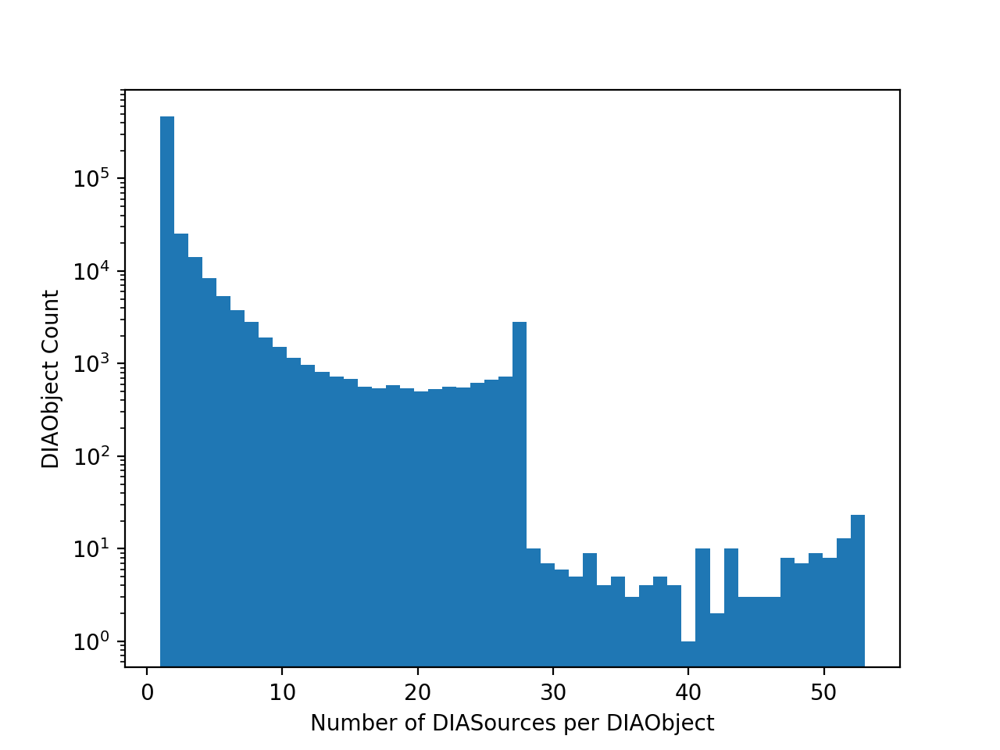

In [46]:
# We want to know how many sourceIDs are attached to any given objectID

obj_id = objTable['id'].values  # object ids from the objTable
conTableSorted = deepcopy(conTable)  # make a for-reals copy of conTable for sorting
con_obj_id = conTableSorted['obj_id'].values  # object ids from the conTable
con_obj_id.sort()  # sort in place

# Find for the first and last place you could insert obj_id into con_obj_id without messing up the sorting
lowerIndex = np.searchsorted(con_obj_id, obj_id, side='left')
upperIndex = np.searchsorted(con_obj_id, obj_id, side='right')
count = upperIndex - lowerIndex
#print(count)

plt.hist(count, bins=50)
plt.yscale('log')
plt.xlabel('Number of DIASources per DIAObject')
plt.ylabel('DIAObject Count')

This is the same as a plot Chris made and shared on slack in #ap-prototype-pipeline back in December 2017.

One question we can ask: how many visits _could have_ gone into each DIAObject? There are 84 total visits which include 3 different fields, and those fields have zero to minimal spatial overlap. It makes sense that we see a dropoff around 84/3 = 28 DIASources per DIAObject since we don't expect (m)any variable objects to appear in more than one field's full set of visits.

We can investigate this a little further if we can back out which visits go into which source IDs.

**But first**, we interrupt your regularly scheduled visit nonsense to bring you some fun plots of detected sources on the sky!

<IPython.core.display.Javascript object>


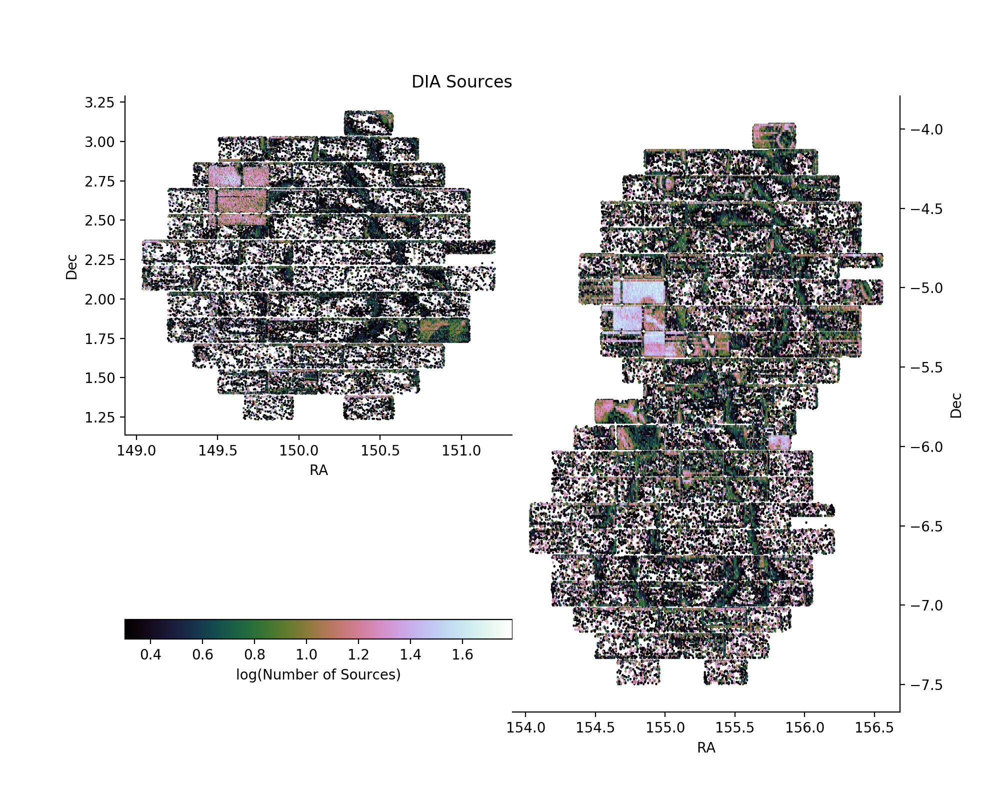

In [47]:
fig = plt.figure(facecolor='white', figsize=(10,8))
plt.subplots_adjust(wspace=0, hspace=0)
dec_set1 = (srcTable['coord_dec'] > -2)
dec_set2 = ~dec_set1

# Panel 1: one HiTS field
ax1 = plt.subplot2grid((4,4), (0,0), rowspan=4, colspan=2)
plot1 = plt.hexbin(srcTable.loc[dec_set1, 'coord_ra'], srcTable.loc[dec_set1, 'coord_dec'], 
                   cmap='cubehelix', bins='log', gridsize=500, mincnt=1)
plt.title('DIA Sources', loc='right')
plt.xlabel('RA')
plt.ylabel('Dec')
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
cb = fig.colorbar(plot1, orientation='horizontal', pad=0.3)
cb.set_label('log(Number of Sources)')

# Panel 2: two (overlapping) HiTS fields
ax2 = plt.subplot2grid((4,4), (0,2), rowspan=4, colspan=2)
plot2 = plt.hexbin(srcTable.loc[dec_set2, 'coord_ra'], srcTable.loc[dec_set2, 'coord_dec'], 
                   cmap='cubehelix', bins='log', gridsize=500, mincnt=1)
plt.xlabel('RA')
plt.ylabel('Dec')
ax2.yaxis.tick_right()
ax2.yaxis.set_label_position('right')
ax2.spines['top'].set_visible(False)
ax2.spines['left'].set_visible(False)

Well **that's** interesting... there are clearly some issues going on here. On the plus side, there are definitely three DECam fields and there are definitely lots of sources detected. On the minus side... some weirdness.

Let's make the same plots for objects rather than sources, just for fun.

<IPython.core.display.Javascript object>


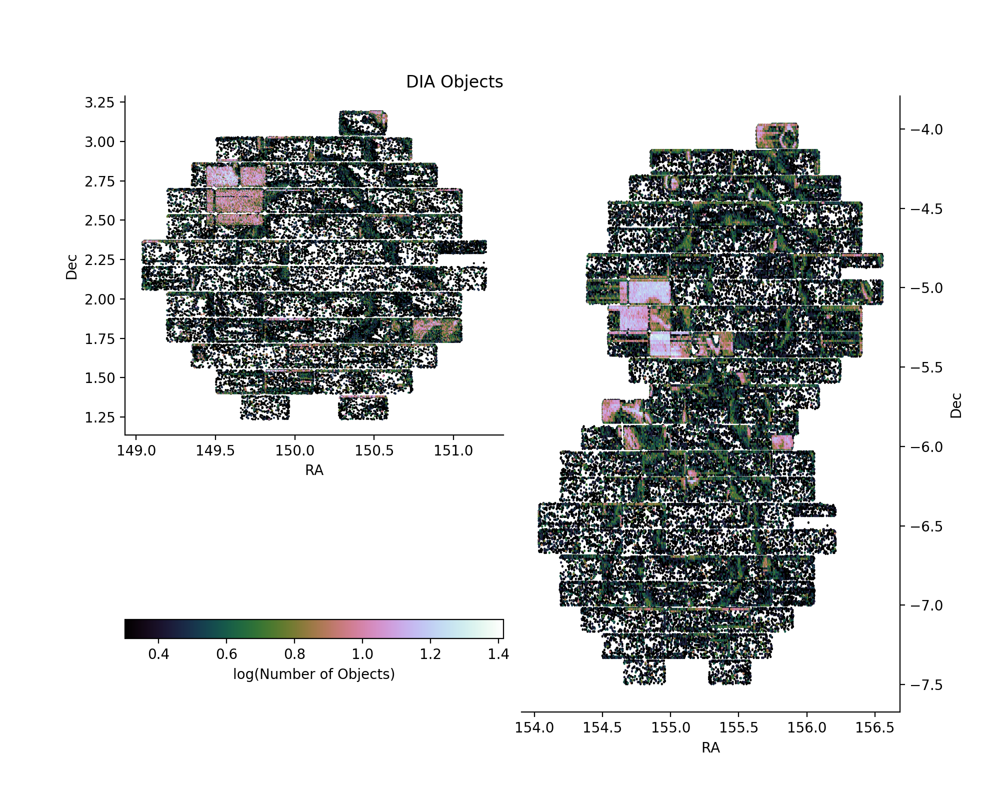

In [48]:
fig = plt.figure(facecolor='white', figsize=(10,8))
plt.subplots_adjust(wspace=0.1, hspace=0)
dec_set1 = (objTable['coord_dec'] > -2)
dec_set2 = ~dec_set1

# Panel 1: one HiTS field
ax1 = plt.subplot2grid((4,4), (0,0), rowspan=4, colspan=2)
ax1.set_facecolor('white')
plot1 = plt.hexbin(objTable.loc[dec_set1, 'coord_ra'], objTable.loc[dec_set1, 'coord_dec'], 
                   cmap='cubehelix', bins='log', gridsize=500, mincnt=1)
plt.title('DIA Objects', loc='right')
plt.xlabel('RA')
plt.ylabel('Dec')
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
cb = fig.colorbar(plot1, orientation='horizontal', pad=0.3)
cb.set_label('log(Number of Objects)')

# Panel 2: two (overlapping) HiTS fields
ax2 = plt.subplot2grid((4,4), (0,2), rowspan=4, colspan=2)
ax2.set_facecolor('white')
plot2 = plt.hexbin(objTable.loc[dec_set2, 'coord_ra'], objTable.loc[dec_set2, 'coord_dec'], 
                   cmap='cubehelix', bins='log', gridsize=500, mincnt=1)
plt.xlabel('RA')
plt.ylabel('Dec')
ax2.yaxis.tick_right()
ax2.yaxis.set_label_position('right')
ax2.spines['top'].set_visible(False)
ax2.spines['left'].set_visible(False)

## Getting source IDs for a given object ID

Two main goals here:
* Function that takes an object ID and returns all associated source IDs
* Function that takes a sourceID and retrieves photomety (correct row in the diaSrc FITS table)

In [13]:
print(srcTable['id'][42])  # a real sourceID that may be useful later on

176486661528486107


In [5]:
def getSourcesFromObject(objId, conTable=conTable):
    """Return a list of source IDs for a given object ID.
    
    Eric thought we could do this in one line with the magic of pandas and he was right!
    
    Inputs
    ------
    objId : `int`
    conTable : pandas dataframe read in from the association db
              (conTable columns are src_id and obj_id)
    Returns
    -------
    sourceIds : array of associated source IDs (ints)
    """
    sourceIds = conTable.loc[conTable['obj_id'] == objId, 'src_id'].values
    return sourceIds

In [12]:
getSourcesFromObject(176486661528486200)

array([176486661528486200, 176675640089510441])

In [10]:
dec_set1 = (objTable['coord_dec'] > -2)
dec_set2 = ~dec_set1

# This is slow !!
src_count1 = [len(getSourcesFromObject(obj)) for obj in objTable.loc[dec_set1, 'id'].values]
src_count2 = [len(getSourcesFromObject(obj)) for obj in objTable.loc[dec_set2, 'id'].values]

<IPython.core.display.Javascript object>


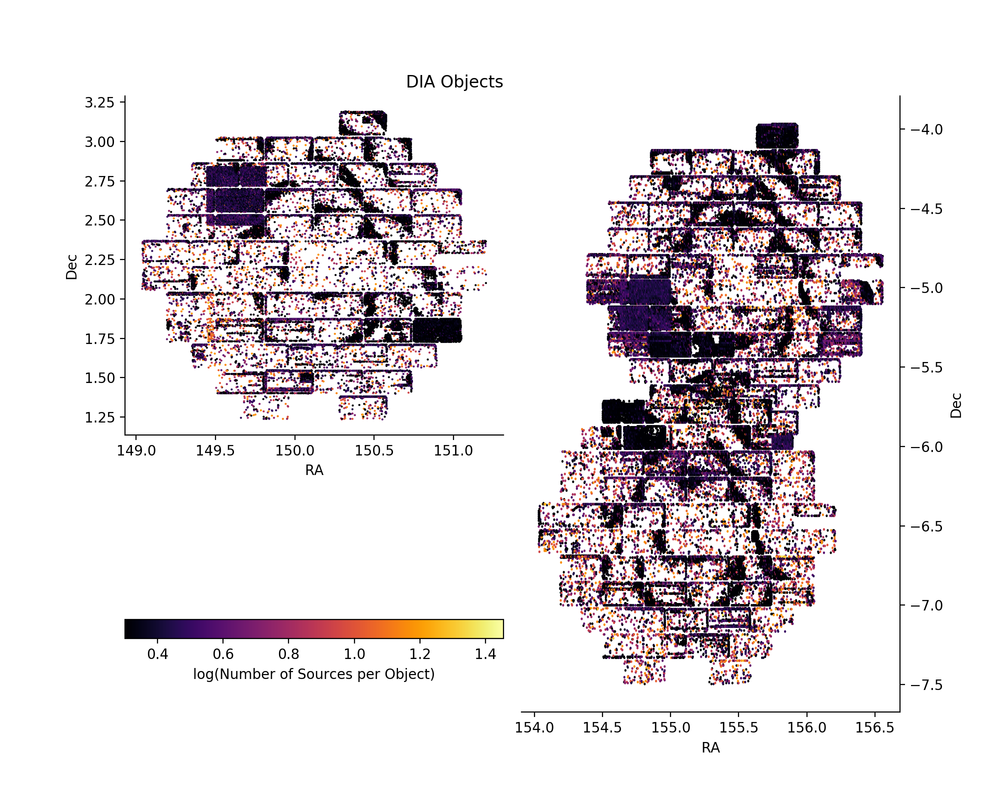

In [11]:
fig = plt.figure(facecolor='white', figsize=(10,8))
plt.subplots_adjust(wspace=0.1, hspace=0)

# Panel 1: one HiTS field
ax1 = plt.subplot2grid((4,4), (0,0), rowspan=4, colspan=2)
ax1.set_facecolor('white')
plot1 = plt.hexbin(objTable.loc[dec_set1, 'coord_ra'], objTable.loc[dec_set1, 'coord_dec'], C=src_count1,
                   cmap='inferno', bins='log', gridsize=500, mincnt=1)
plt.title('DIA Objects', loc='right')
plt.xlabel('RA')
plt.ylabel('Dec')
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
cb = fig.colorbar(plot1, orientation='horizontal', pad=0.3)
cb.set_label('log(Number of Sources per Object)')

# Panel 2: two (overlapping) HiTS fields
ax2 = plt.subplot2grid((4,4), (0,2), rowspan=4, colspan=2)
ax2.set_facecolor('white')
plot2 = plt.hexbin(objTable.loc[dec_set2, 'coord_ra'], objTable.loc[dec_set2, 'coord_dec'], C=src_count2,
                   cmap='inferno', bins='log', gridsize=500, mincnt=1)
plt.xlabel('RA')
plt.ylabel('Dec')
ax2.yaxis.tick_right()
ax2.yaxis.set_label_position('right')
ax2.spines['top'].set_visible(False)
ax2.spines['left'].set_visible(False)

## Retrieving what is needed to build a butler dataId

The only information currently in the association database about each source and object is its ID. We need to use the Butler to access the `deepDiff_diaSrc` and/or the `deepDiff_differenceExp` corresponding to that ID if we want to plot a light curve. For DECam, this means we need to somehow turn the long source ID (and/or object ID) into a visit and a ccdnum. Let's try.

In [14]:
# Pick a random visit and ccd and see if we can build a srcId
visit = 410915
ccdnum = 42
expId = int("%07d%02d" % (visit, ccdnum))  # what computeCcdExposureId does in DecamMapper.py
expId << 32  # ~bitshift dance~ hey good that looks like about the right kind of number for a srcId!

176486829032210432

In [15]:
testSrcId = 176486661528486120  # we know this is an actual srcId
bits = 32  # our new favorite bitshift dance number

dataIdInfo = testSrcId >> bits
print(testSrcId)
print(dataIdInfo)

testVisit = str(testSrcId >> bits)[:-2]
testCcdnum = str(testSrcId >> bits)[-2:]
print(testVisit, testCcdnum)
testDataId = {'visit': int(testVisit), 'ccdnum': int(testCcdnum)}
#butlerTable = butler.get('deepDiff_diaSrc', dataId=testDataId)  # this works

176486661528486120
41091503
410915 03


This is promising! `410915` is indeed the number of a processed visit. There are 62 CCDs, and 3 is one of them.

Let's choose a single known object ID as a test case and see what source visits comprise it.

In [6]:
def getDataIdFromSrcId(srcId, bits=32):
    dataIdInfo = srcId >> bits
    #print(srcId, dataIdInfo)
    visit = int(str(dataIdInfo)[:-2])
    ccdnum = int(str(dataIdInfo)[-2:])
    dataId = {'visit': visit, 'ccdnum': ccdnum}
    return dataId

In [17]:
#objId = 176486661528486074
objId = 176632699006484759
print('object', objId)
for srcId in getSourcesFromObject(objId):
    dataId = getDataIdFromSrcId(srcId)
    print(srcId, dataId)

object 176632699006484759
176486670118420623 {'visit': 410915, 'ccdnum': 5}
176510721935278211 {'visit': 410971, 'ccdnum': 5}
176632699006484759 {'visit': 411255, 'ccdnum': 5}
176654173842964988 {'visit': 411305, 'ccdnum': 5}
176675648679445401 {'visit': 411355, 'ccdnum': 5}
176697553012654286 {'visit': 411406, 'ccdnum': 5}
176719027849134203 {'visit': 411456, 'ccdnum': 5}
176870210697953452 {'visit': 411808, 'ccdnum': 5}
177169140421755189 {'visit': 412504, 'ccdnum': 5}
177233564931195184 {'visit': 412654, 'ccdnum': 5}
177255039767675204 {'visit': 412704, 'ccdnum': 5}
181071547706900629 {'visit': 421590, 'ccdnum': 5}


## Getting calibrated flux information

Exposure objects have a `getCalib` method, which has a function that returns a calibrated magnitude for the uncalibrated PSF flux stored in the DIA Source Table. Unfortunately this means we have to read in both the table **and** the difference image (which is slow).

Let's write a useful function to get the calibrated PSF magnitude for a source.

In [18]:
def getPsfMagnitude(srcId, butler=butler, reserved=32):
    """Get the times, PSF Magnitudes, and error bars from a source in order to build a light curve.
    
    Inputs
    ------
    srcId : `int` a source ID that has been diffim-ed
    butler : `dafPersist.butler` a butler in the diffim repo
    reserved : `int` how far srcId must be bitshifted to retrieve the visit and ccd info
    
    Returns
    -------
    result : `list`
        result contains [timestamp, magnitude, magErr, sign] for the calibrated difference image source.
        timestamp : `datetime.datetime`
        magnitude : `float`
        magErr : `float`
        sign : `int` -1 for negative flux sources, +1 for positive flux sources
    """
    dataId = getDataIdFromSrcId(srcId)
    diaSrc = butler.get('deepDiff_diaSrc', dataId)
    record = diaSrc.find(srcId)
    psfFlux = record.get('base_PsfFlux_flux')  # uncalibrated
    psfFluxErr = record.get('base_PsfFlux_fluxSigma')
    diffim = butler.get('deepDiff_differenceExp', dataId)
    calib = diffim.getCalib()
    obsTime = diffim.getInfo().getVisitInfo().getDate().toPython()
    #dateObs = diffim.getMetadata().get('DATE-OBS')
    #print(srcId, visit, ccdnum, psfFlux, obsTime)
    if psfFlux < 0:  # negative flux is OK in a difference image but we have to handle it carefully
        calibMag = calib.getMagnitude(flux=np.abs(psfFlux), fluxErr=psfFluxErr)
        sign = -1
    elif psfFlux >= 0:
        calibMag = calib.getMagnitude(flux=psfFlux, fluxErr=psfFluxErr)
        sign = 1
    else:
        calibMag = (np.nan, np.nan)
        sign = np.nan
    result = [obsTime, calibMag[0], calibMag[1], sign]  # return dataId later if we want it...
    return result

In [20]:
# Warning: this is slow !!!
objDict = {}
for objId in objTable['id'][50000:52000].values:
    if len(getSourcesFromObject(objId)) >= 10:
        print('objId: ', objId)
        magsToPlot = []
        for source in getSourcesFromObject(objId):
            mags = getPsfMagnitude(source)
            print(mags)
            magsToPlot.append(mags)
        objDict[objId] = magsToPlot

objId:  176632699006484759
[datetime.datetime(2015, 2, 17, 3, 23, 52, 400354), 23.010584854598847, 0.22217432645311486, 1]
[datetime.datetime(2015, 2, 17, 5, 27, 9, 141458), 22.55400120925853, 0.1872553303873998, -1]
[datetime.datetime(2015, 2, 18, 1, 41, 35, 163833), 23.61967374699445, 0.5318926651676501, -1]
[datetime.datetime(2015, 2, 18, 3, 18, 55, 926002), 22.457463072740687, 0.13096320752808266, 1]
[datetime.datetime(2015, 2, 18, 4, 56, 31, 316617), 21.48087582907145, 0.048917991067934624, 1]
[datetime.datetime(2015, 2, 18, 6, 37, 38, 953316), 27.073477674846103, 10.198258916015389, -1]
[datetime.datetime(2015, 2, 18, 8, 17, 1, 569851), 22.84472166412854, 0.40036495870549244, -1]
[datetime.datetime(2015, 2, 19, 6, 33, 10, 396659), 24.61730415826935, 1.244907551629234, 1]
[datetime.datetime(2015, 2, 22, 1, 26, 13, 521918), 23.161380788192453, 0.38207214422000324, -1]
[datetime.datetime(2015, 2, 22, 6, 20, 14, 411669), 22.61447809278574, 0.19952363839862633, -1]
[datetime.datetime(

[datetime.datetime(2015, 2, 27, 4, 6, 59, 341680), 22.76228755085402, 0.1779319863019707, -1]
objId:  176632716186354636
[datetime.datetime(2015, 2, 18, 1, 41, 35, 163833), 23.00764766683009, 0.19324637731522654, 1]
[datetime.datetime(2015, 2, 19, 1, 36, 52, 340378), 22.852043891314352, 0.1643543827741938, 1]
[datetime.datetime(2015, 2, 19, 4, 54, 10, 864426), 22.87411913921444, 0.12532605125492768, 1]
[datetime.datetime(2015, 2, 21, 1, 29, 29, 209347), 22.738416518485856, 0.19339019691074966, 1]
[datetime.datetime(2015, 2, 22, 1, 26, 13, 521918), 22.69015227667646, 0.16708277938912983, 1]
[datetime.datetime(2015, 2, 22, 3, 3, 12, 772555), 23.00788115904532, 0.15623133544425227, 1]
[datetime.datetime(2015, 2, 22, 6, 20, 14, 411669), 22.72935668116442, 0.15447003731078848, 1]
[datetime.datetime(2015, 2, 22, 7, 58, 51, 533944), 22.785231963999202, 0.1787559732453915, 1]
[datetime.datetime(2015, 2, 24, 2, 41, 16, 686289), 23.08030981935685, 0.19367716205736932, 1]
[datetime.datetime(2015,

[datetime.datetime(2015, 2, 19, 3, 14, 2, 966169), 23.53445510618033, 0.3319433280238574, 1]
[datetime.datetime(2015, 2, 22, 3, 3, 12, 772555), 24.783358510966988, 1.1144439202654268, 1]
[datetime.datetime(2015, 2, 24, 2, 41, 16, 686289), 25.29038702276708, 1.7931636328358582, 1]
[datetime.datetime(2015, 2, 24, 4, 9, 31, 153003), 26.52317176988153, 5.044665119682398, 1]
[datetime.datetime(2015, 3, 14, 4, 6, 10, 412249), 23.183220227591125, 0.21590039125116997, -1]
objId:  176632724776288446
[datetime.datetime(2015, 2, 17, 5, 27, 9, 141458), 21.695657363236318, 0.05454444632860887, -1]
[datetime.datetime(2015, 2, 18, 1, 41, 35, 163833), 21.540492698055278, 0.08513096583523468, -1]
[datetime.datetime(2015, 2, 18, 3, 18, 55, 926002), 21.895821765777207, 0.05314143195099719, -1]
[datetime.datetime(2015, 2, 18, 6, 37, 38, 953316), 21.78757491178692, 0.06817612095498256, -1]
[datetime.datetime(2015, 2, 19, 1, 36, 52, 340378), 22.400205774291543, 0.10866300635885198, -1]
[datetime.datetime(20

Hooray! It's a bit interesting that some of the sources flip sign. (It's relative to an arbitrary template, though, and these sources could all be in a "garbage region" of the spatial plots earlier; we don't know right now.)

## Let's make some ~~awful~~ not-entirely-awful light curves!

We'll set it up so the errorbar will appear orange (instead of blue) if the source has a negative flux. Colors in errorbar plots are weird so that's fine for now.

<IPython.core.display.Javascript object>


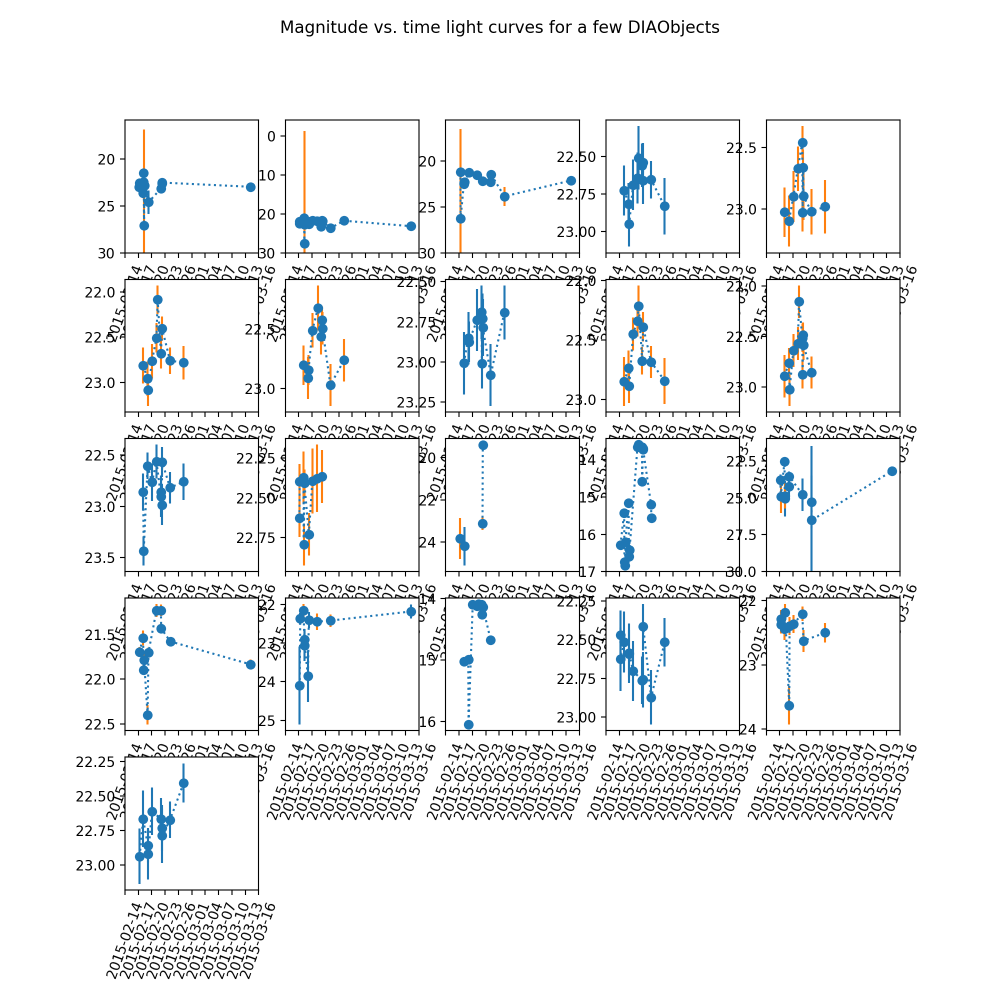

In [49]:
npanels = len(objDict.items())
plt.figure(figsize=(10,10))
plt.suptitle('Magnitude vs. time light curves for a few DIAObjects')
for idx, (obj, mags) in enumerate(objDict.items()):
    plt.subplot(5, 5, idx+1)  # future todo: make several panels in one figure instead of several figures
    times = np.arange(len(mags))
    #dataIds = [mag[0] for mag in mags]  # LIES
    signs = [mag[3] for mag in mags]
    colors = ['C0' if sign > 0 else 'C1' for sign in signs]
    #print(colors)
    times = [mag[0] for mag in mags]
    #print(times)
    #times = np.arange(len(mags))
    plt.errorbar(times, [mag[1] for mag in mags], yerr=[mag[2] for mag in mags], marker='o', ecolor=colors, ls=':')
    #plt.title('object: ' + str(obj))
    #plt.xlabel('Time')
    #plt.ylabel('Magnitude')
    plt.gca().invert_yaxis()
    plt.xticks(rotation=70)
    plt.xlim([datetime.datetime(2015, 2, 14, 0, 0, 0, 0), datetime.datetime(2015, 3, 16, 0, 0, 0, 0)])
    if plt.ylim()[0] > 30:
        plt.ylim(ymin=30)
    

## Let's make some plots of DIAObject characteristic fluxes

We'll calculate the median magnitude and corresponding RMS for each DIAObject containing at least ten DIASources. Or, at least, for some of them, since doing it for all would take **forever** with opening each difference image up to read in all the necessary information.

In [39]:
# Slow time !!!
objDictAll = {}
for idx, objId in enumerate(objTable['id'][0:10000].values):
    if len(getSourcesFromObject(objId)) >= 10:
        objDictAll[objId] = [getPsfMagnitude(source) for source in getSourcesFromObject(objId)]
        print(idx, 'objId', objId, str(objId >> 32)[:-2], str(objId >> 32)[-2:], 'has', len(objDictAll[objId]), 'sources')

618 objId 176486687298289911 410915 09 has 12 sources
623 objId 176486687298289924 410915 09 has 11 sources
630 objId 176486687298289951 410915 09 has 11 sources
683 objId 176486695888224461 410915 11 has 15 sources
785 objId 176486704478159588 410915 13 has 10 sources
799 objId 176486704478159617 410915 13 has 11 sources
825 objId 176486704478159656 410915 13 has 11 sources
841 objId 176486704478159678 410915 13 has 10 sources
845 objId 176486704478159684 410915 13 has 10 sources
846 objId 176486704478159686 410915 13 has 10 sources
881 objId 176486704478159728 410915 13 has 10 sources
885 objId 176486704478159734 410915 13 has 10 sources
897 objId 176486704478159750 410915 13 has 10 sources
979 objId 176486704478159849 410915 13 has 11 sources
982 objId 176486704478159852 410915 13 has 12 sources
1004 objId 176486704478159876 410915 13 has 10 sources
1011 objId 176486704478159884 410915 13 has 13 sources
1026 objId 176486704478159903 410915 13 has 13 sources
1036 objId 17648670447815

108


<IPython.core.display.Javascript object>


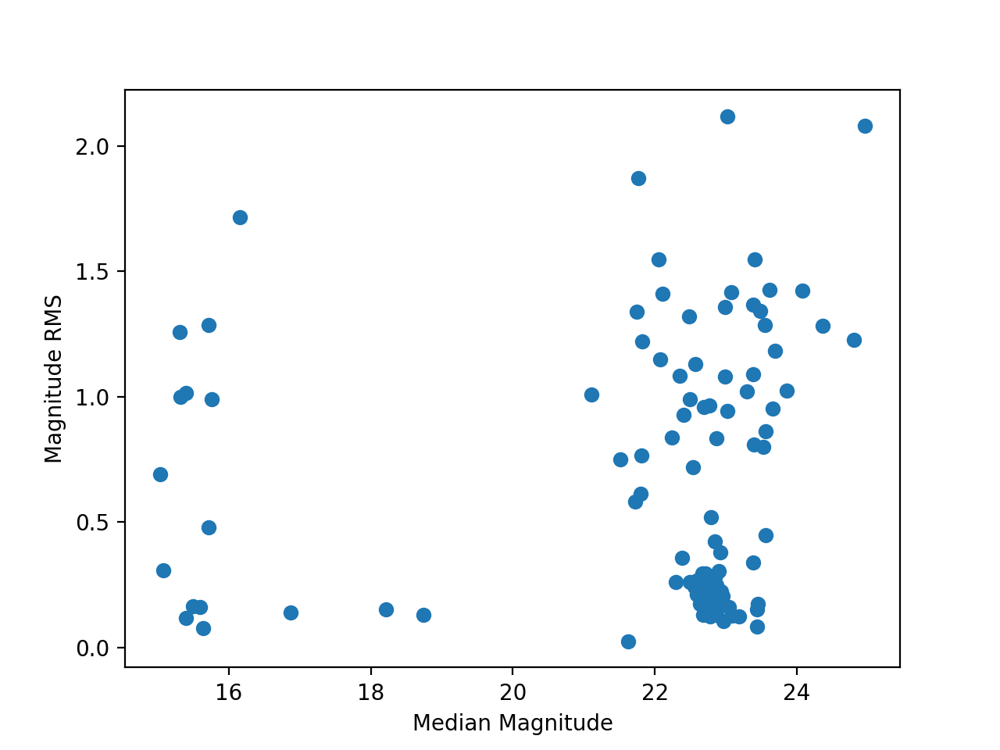

In [50]:
print(len(objDictAll))
plt.figure()
plt.xlabel('Median Magnitude')
plt.ylabel('Magnitude RMS')
for obj, mags in objDictAll.items():
    medMag = np.nanmedian([mag[1] for mag in mags])
    #magErrs = [mag[2] for mag in mags]
    rmsMag = np.nanstd([mag[1] for mag in mags])  # actual RMS, not median of errorbars
    #print(obj, medMag, rmsMag)
    plt.plot(medMag, rmsMag, marker='o', ls='None', color='C0')

##  Future work

There's lots to be improved in the future. We plan to reprocess this dataset with the new and improved `ap_pipe` (bonus: crosstalk correction!!) and `ap_associate` which should persist dataId info so it's easy to retrieve, e.g., timestamps. Some ideas include:

* More light curves!
* Some basic characterization of different types of light curve
* Displaying a gallery of difference images adjacent to a light curve
* Indicating where in the sky a given object is located in the context of the DECam field of view
* Sorting out why there are so many apparent "garbage sources" in certain regions (edges, buggy patches, large-scale camera plane structure, etc.)
* Investigating template coaddds more deeply (pun intended) once we have an easy way to trace which coadd was used for any given diffim

## Cutouts

Let's make little difference image cutouts!

<IPython.core.display.Javascript object>


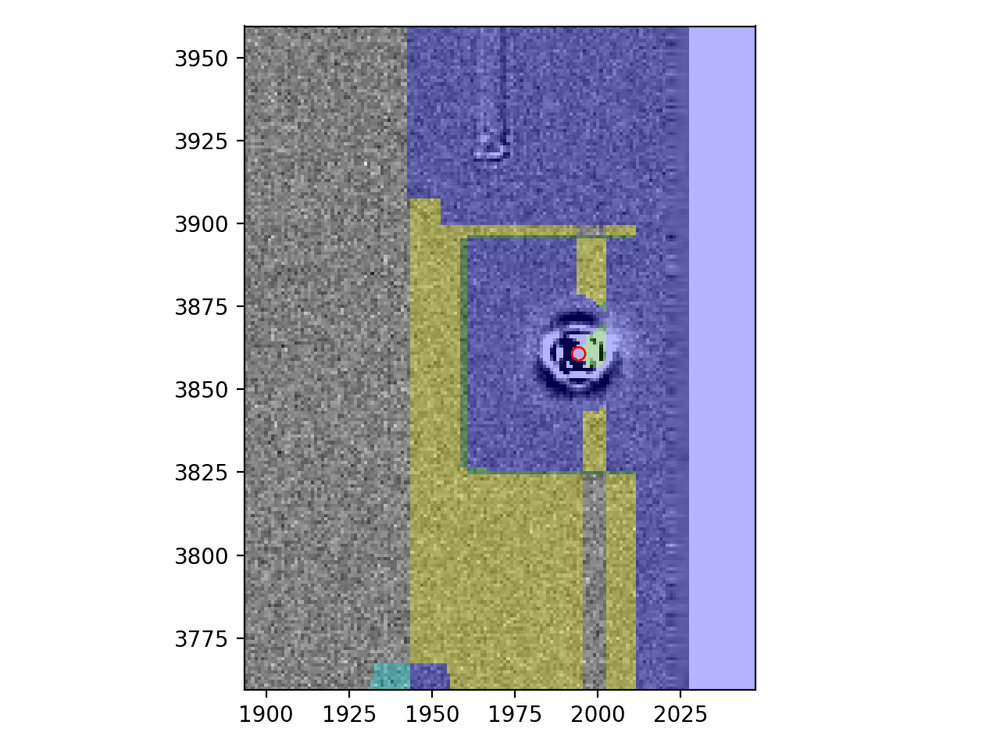

<IPython.core.display.Javascript object>


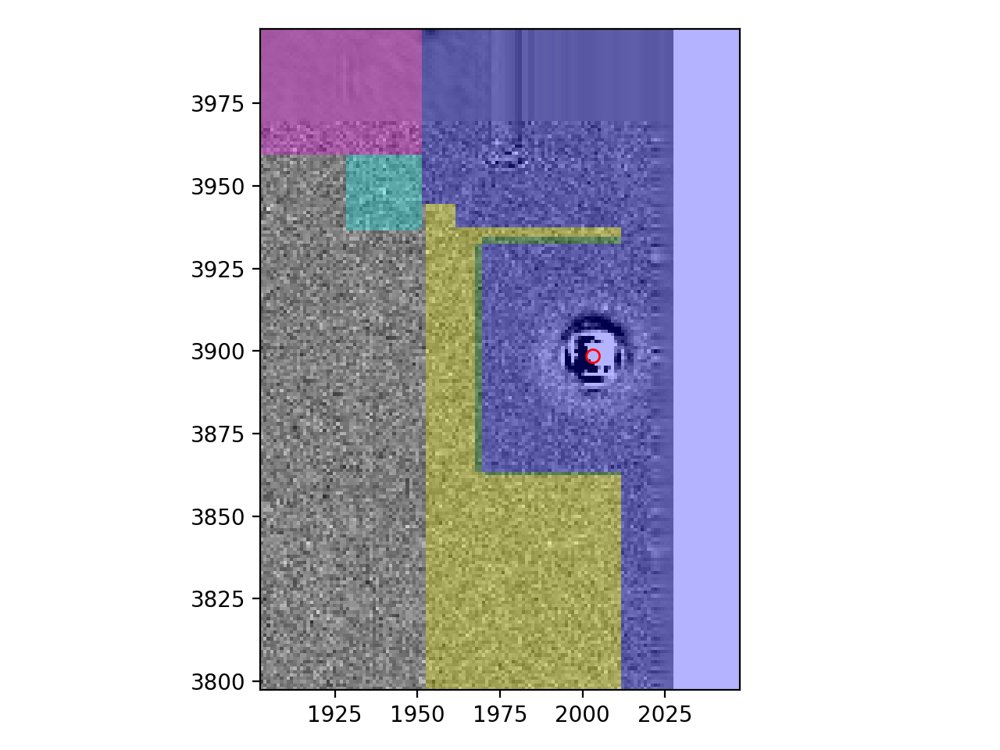

(1903, 3798)
{'visit': 410915, 'ccdnum': 25}
(1915, 3788)
{'visit': 410971, 'ccdnum': 25}


<IPython.core.display.Javascript object>


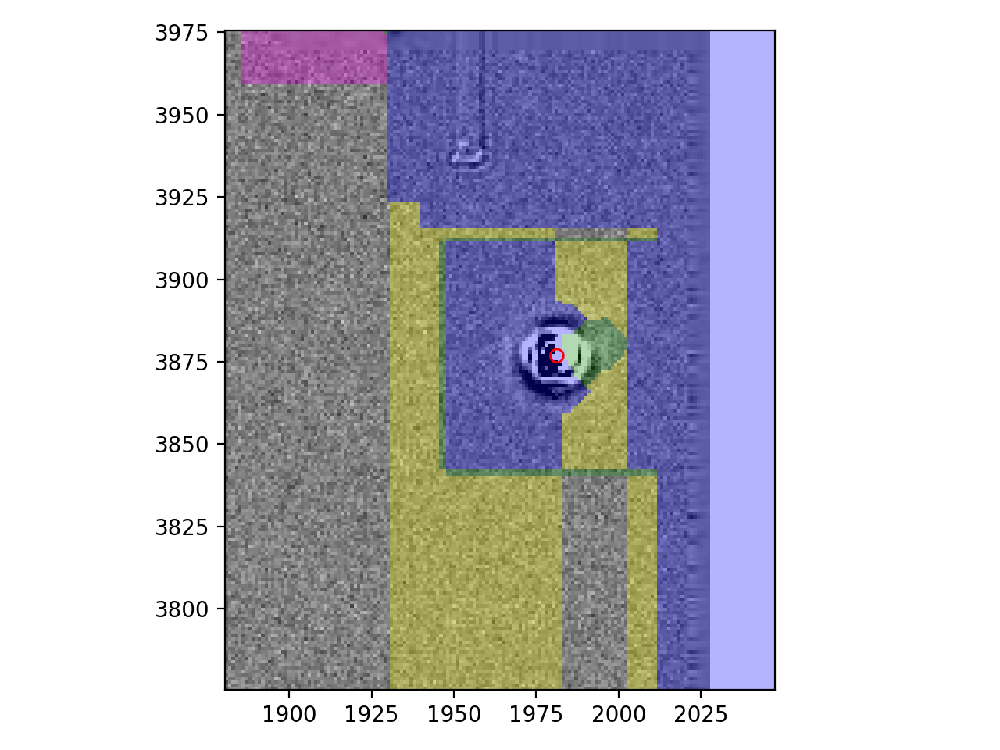

(1881, 3776)
{'visit': 411021, 'ccdnum': 25}


<IPython.core.display.Javascript object>


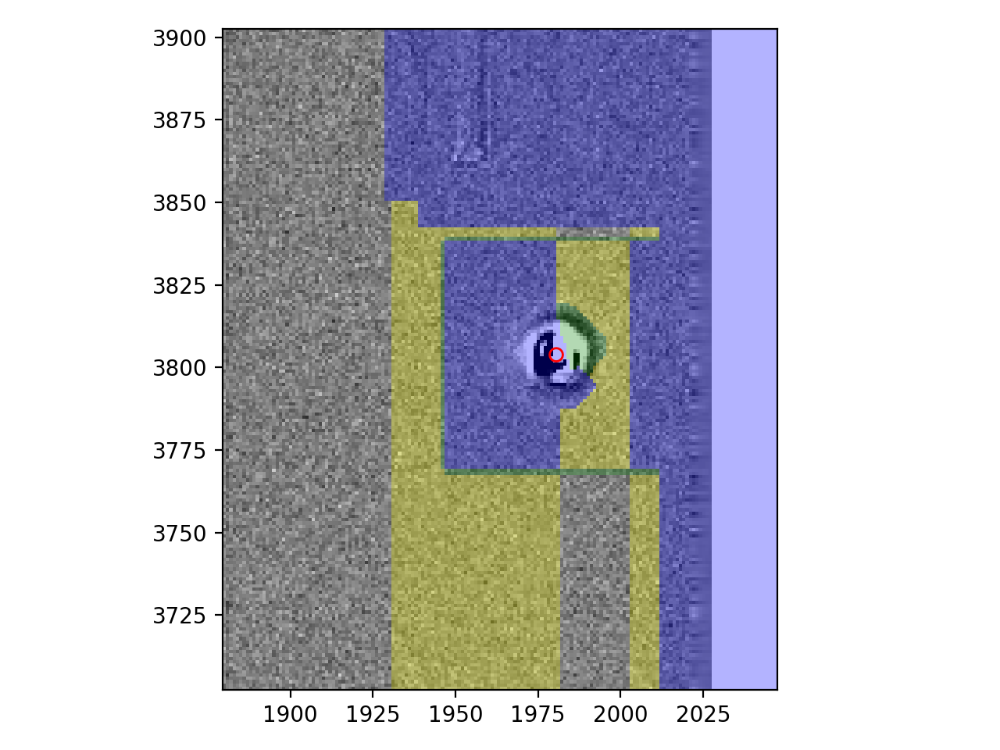

(1880, 3703)
{'visit': 411055, 'ccdnum': 25}


<IPython.core.display.Javascript object>


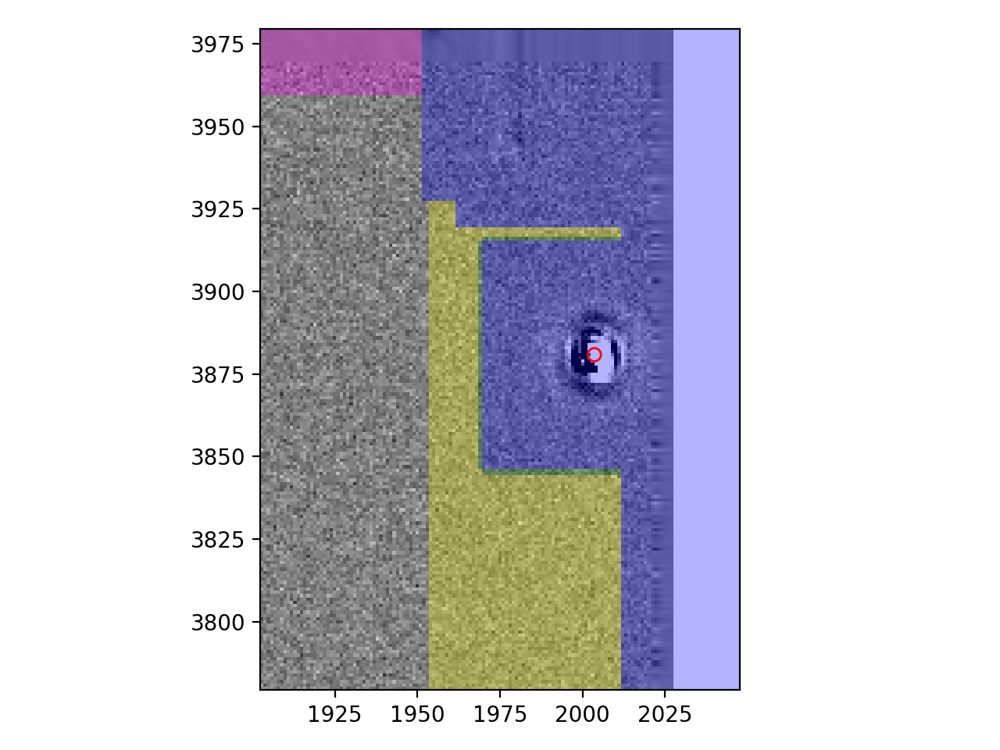

(1903, 3780)
{'visit': 411255, 'ccdnum': 25}


<IPython.core.display.Javascript object>


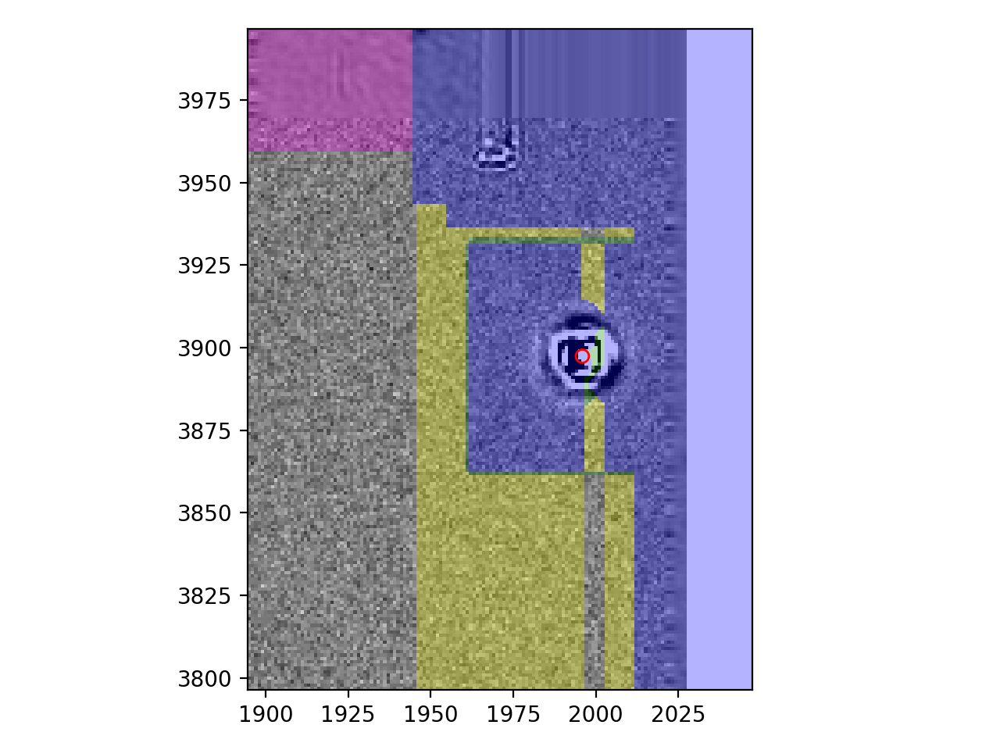

(1895, 3797)
{'visit': 411305, 'ccdnum': 25}


<IPython.core.display.Javascript object>


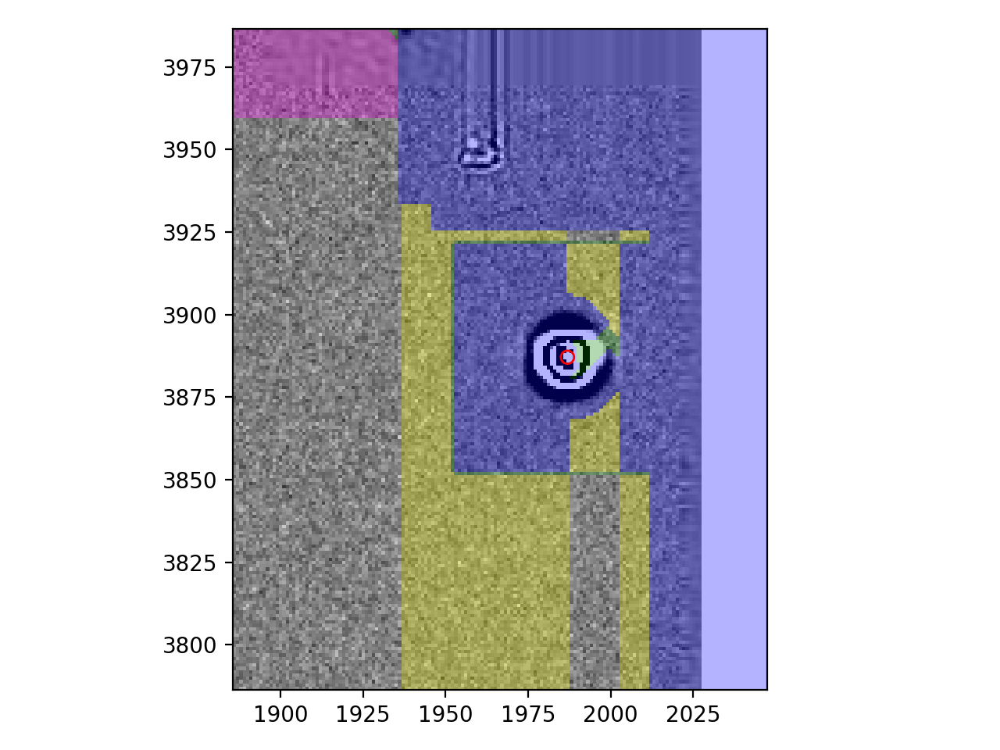

(1886, 3787)
{'visit': 411355, 'ccdnum': 25}


<IPython.core.display.Javascript object>


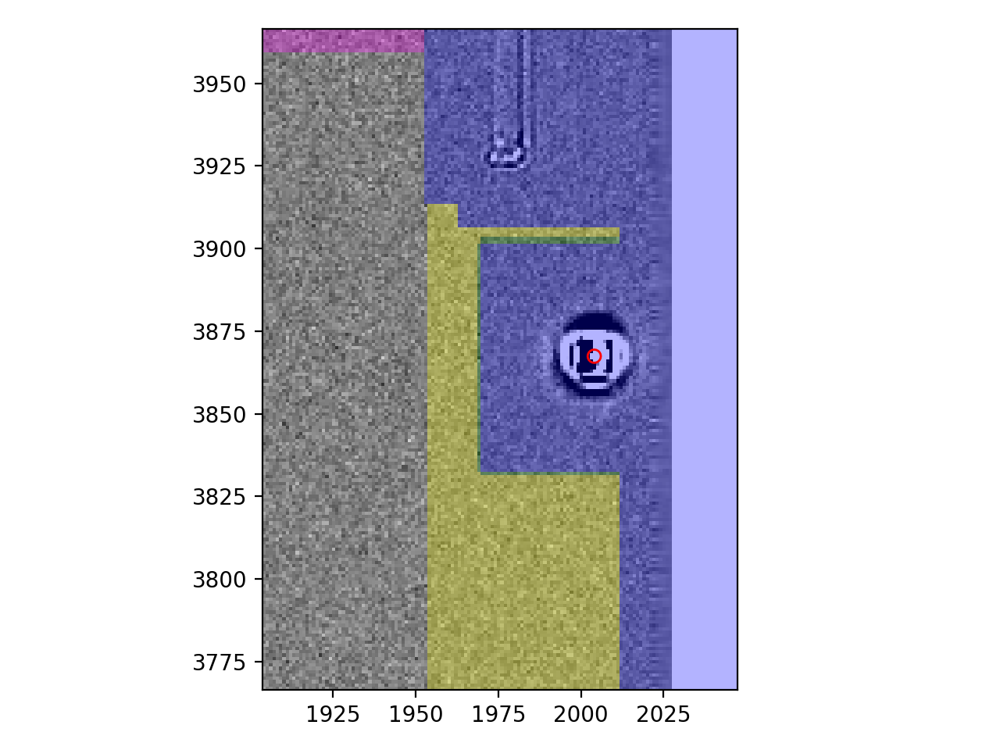

(1904, 3767)
{'visit': 411406, 'ccdnum': 25}


<IPython.core.display.Javascript object>


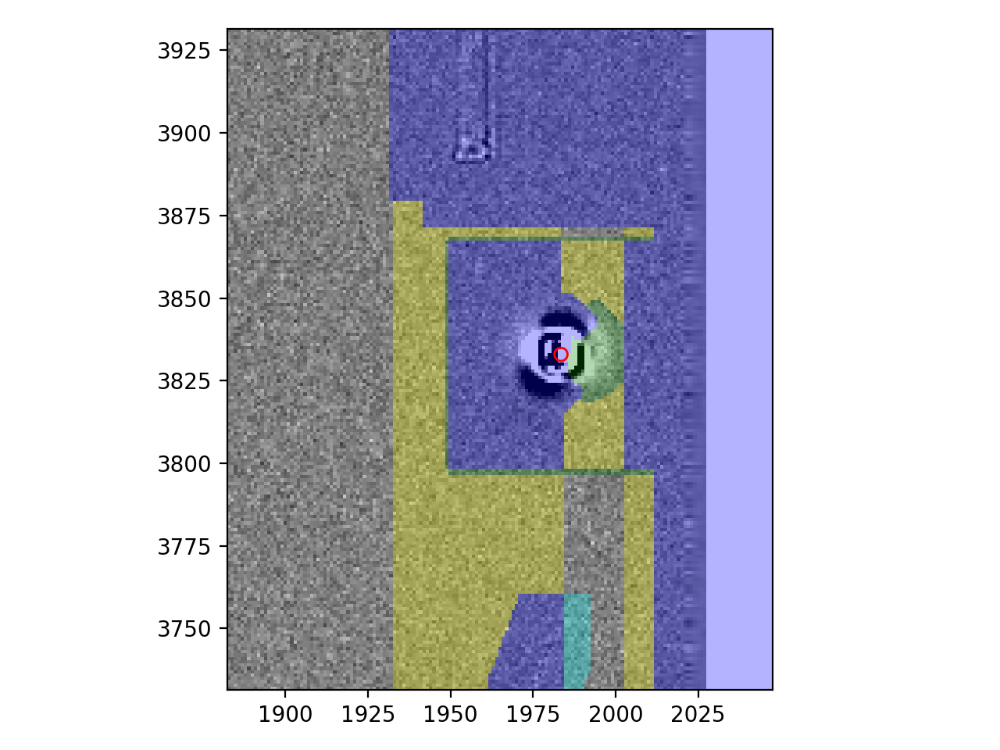

(1883, 3732)
{'visit': 411456, 'ccdnum': 25}


<IPython.core.display.Javascript object>


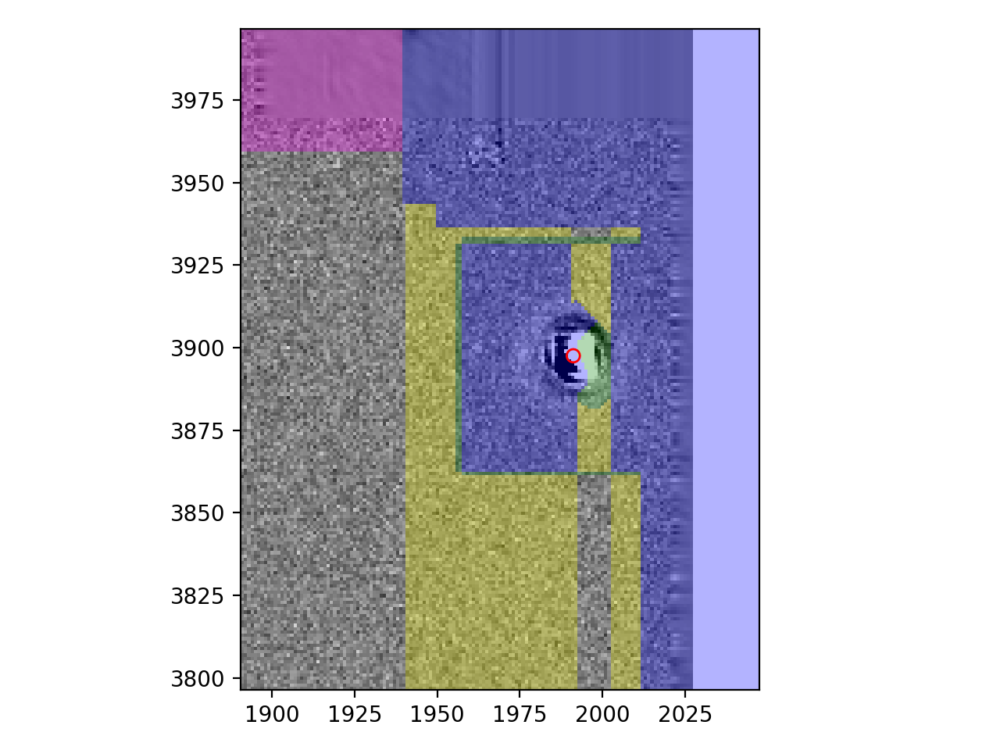

(1891, 3797)
{'visit': 411657, 'ccdnum': 25}


<IPython.core.display.Javascript object>


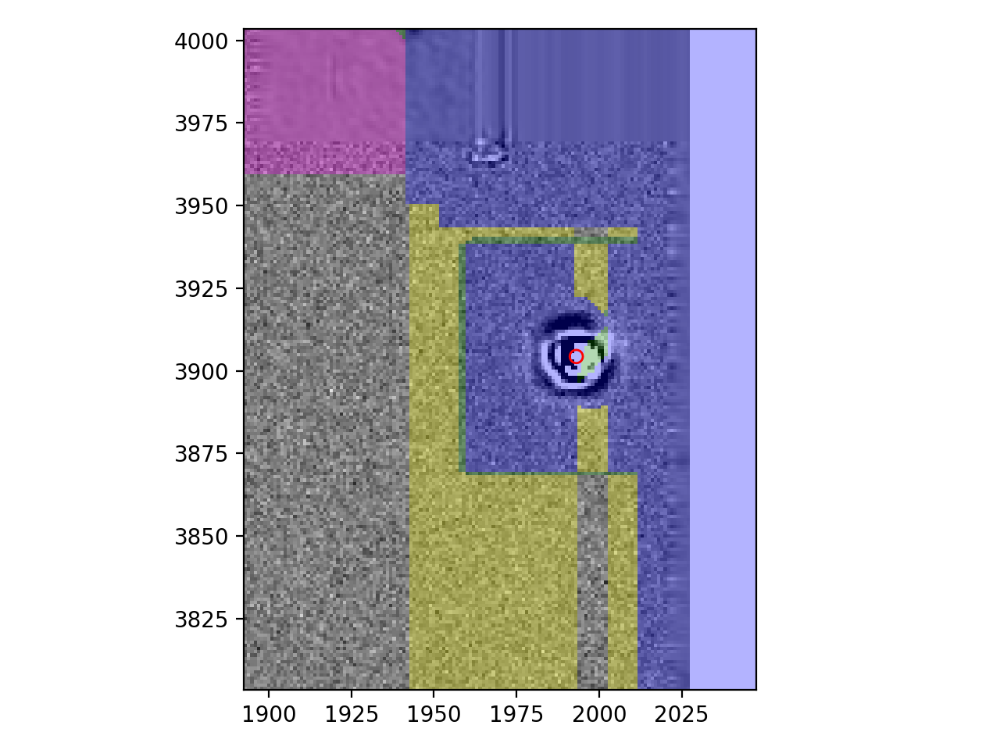

(1893, 3804)
{'visit': 411707, 'ccdnum': 25}


<IPython.core.display.Javascript object>


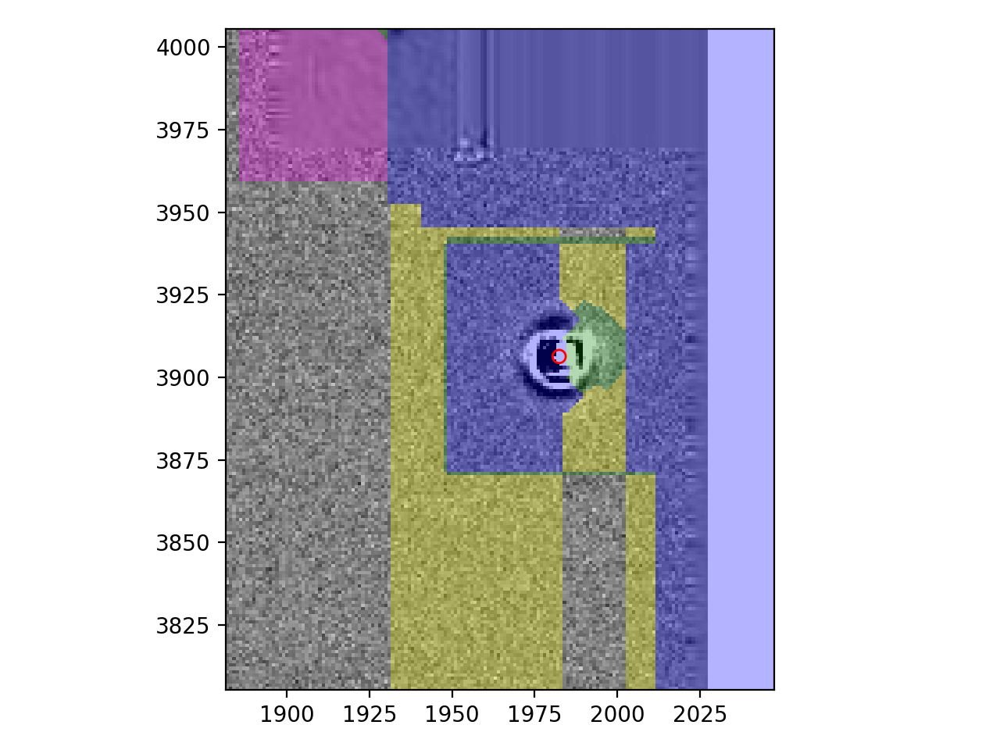

(1882, 3806)
{'visit': 411758, 'ccdnum': 25}


<IPython.core.display.Javascript object>


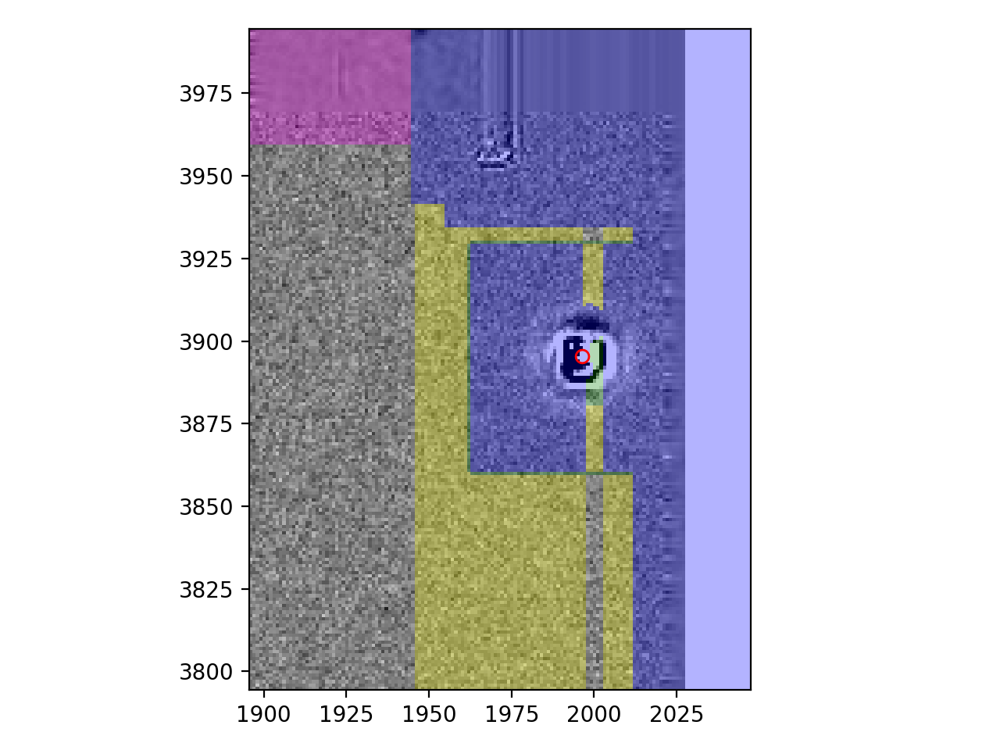

(1896, 3795)
{'visit': 411808, 'ccdnum': 25}


<IPython.core.display.Javascript object>


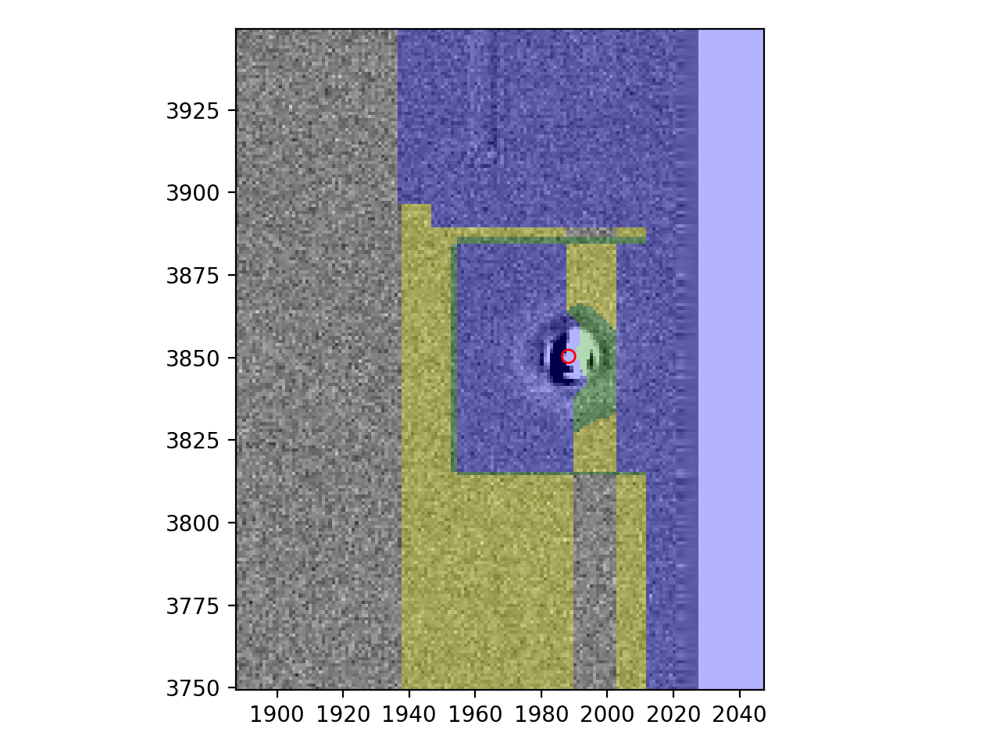

(1888, 3750)
{'visit': 411858, 'ccdnum': 25}


<IPython.core.display.Javascript object>


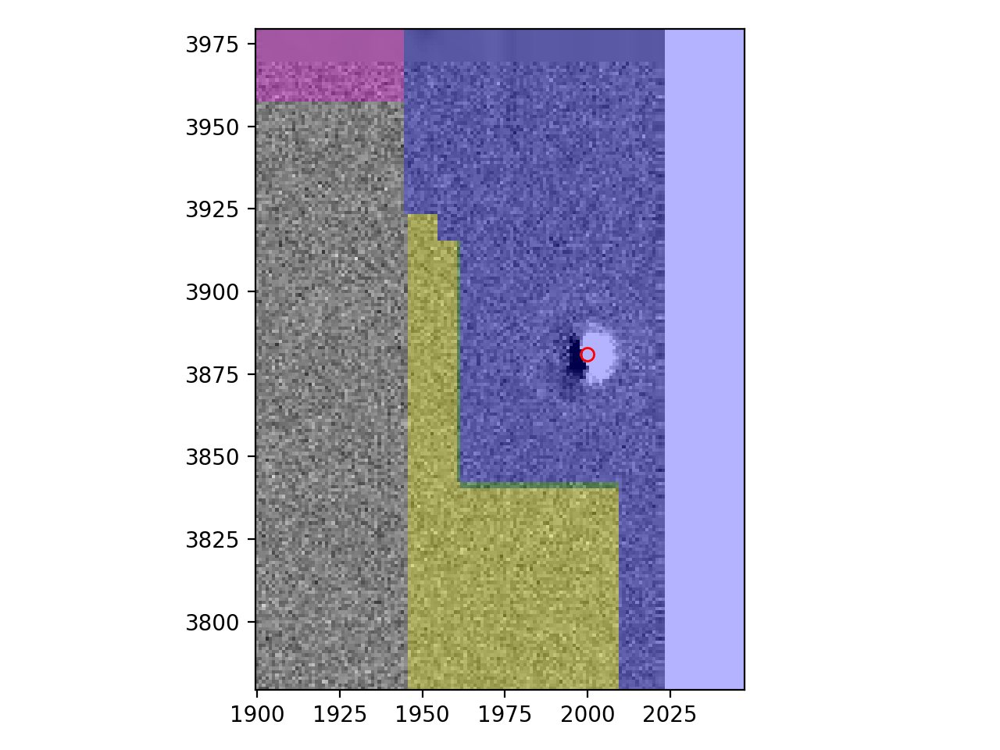

(1900, 3780)
{'visit': 412060, 'ccdnum': 25}


<IPython.core.display.Javascript object>


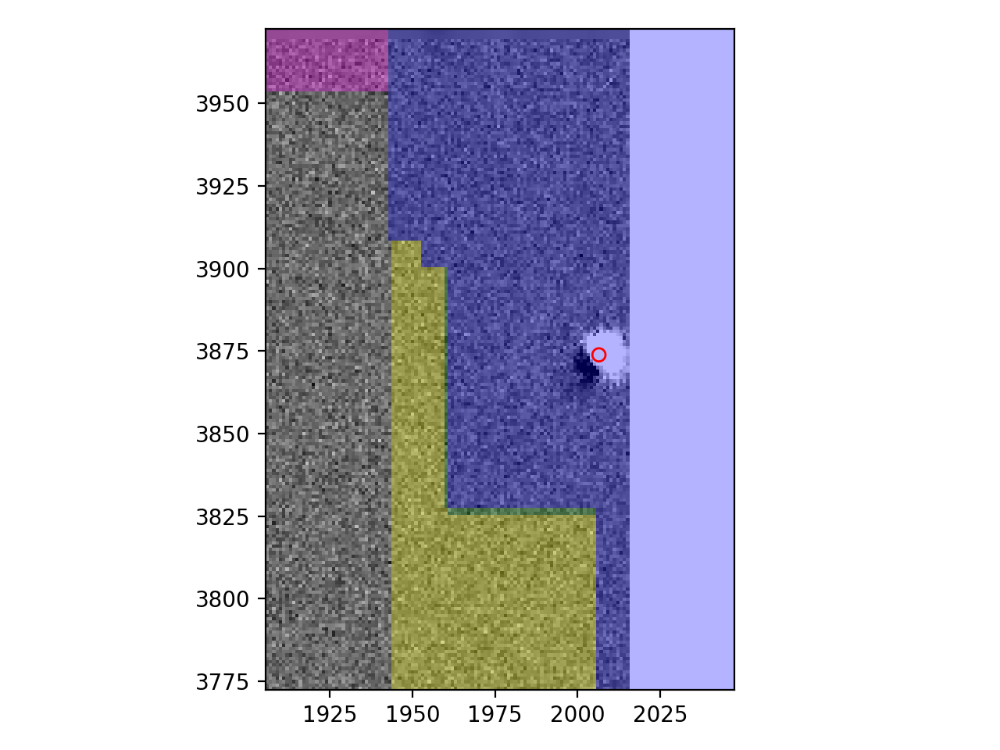

(1906, 3773)
{'visit': 412250, 'ccdnum': 25}


<IPython.core.display.Javascript object>


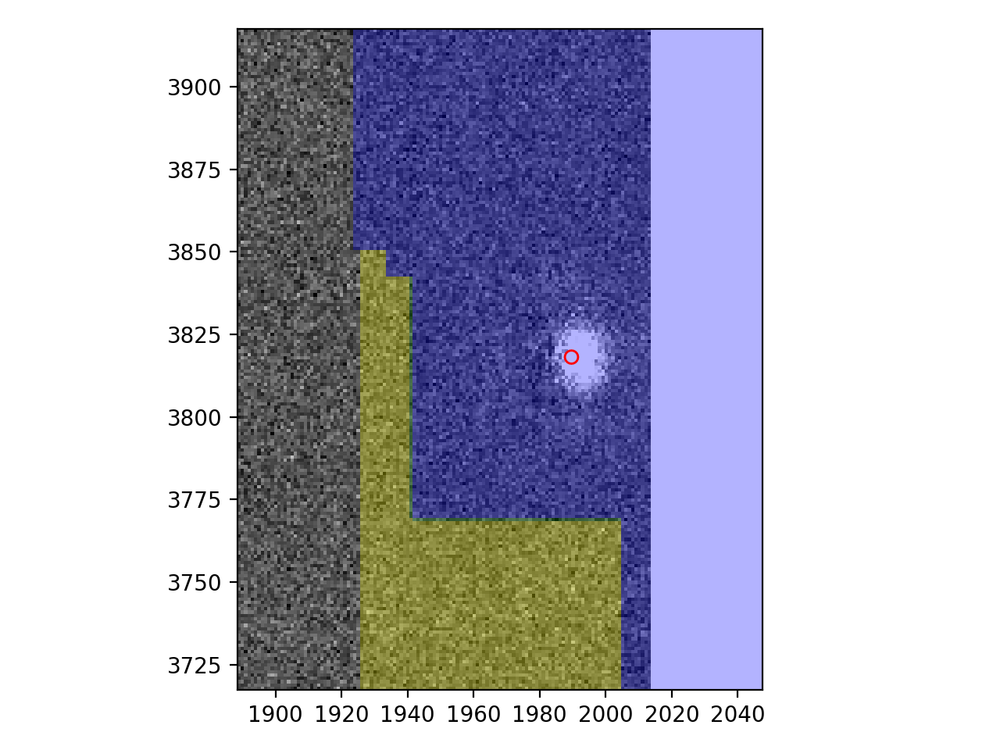

(1889, 3718)
{'visit': 412307, 'ccdnum': 25}


<IPython.core.display.Javascript object>


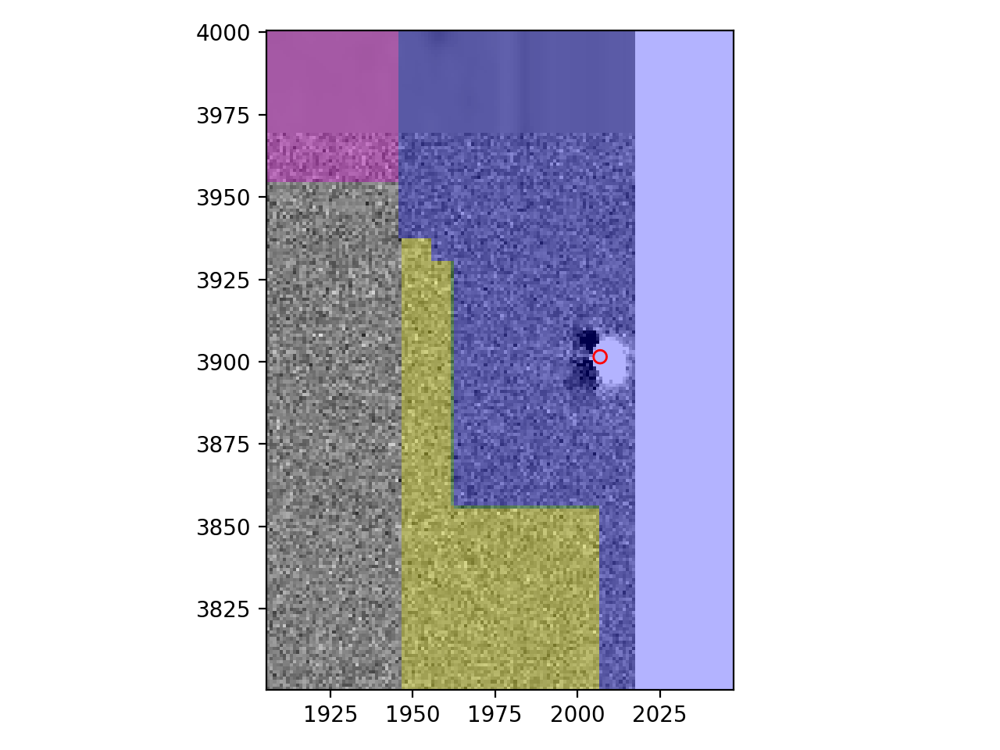

(1906, 3801)
{'visit': 412504, 'ccdnum': 25}


<IPython.core.display.Javascript object>


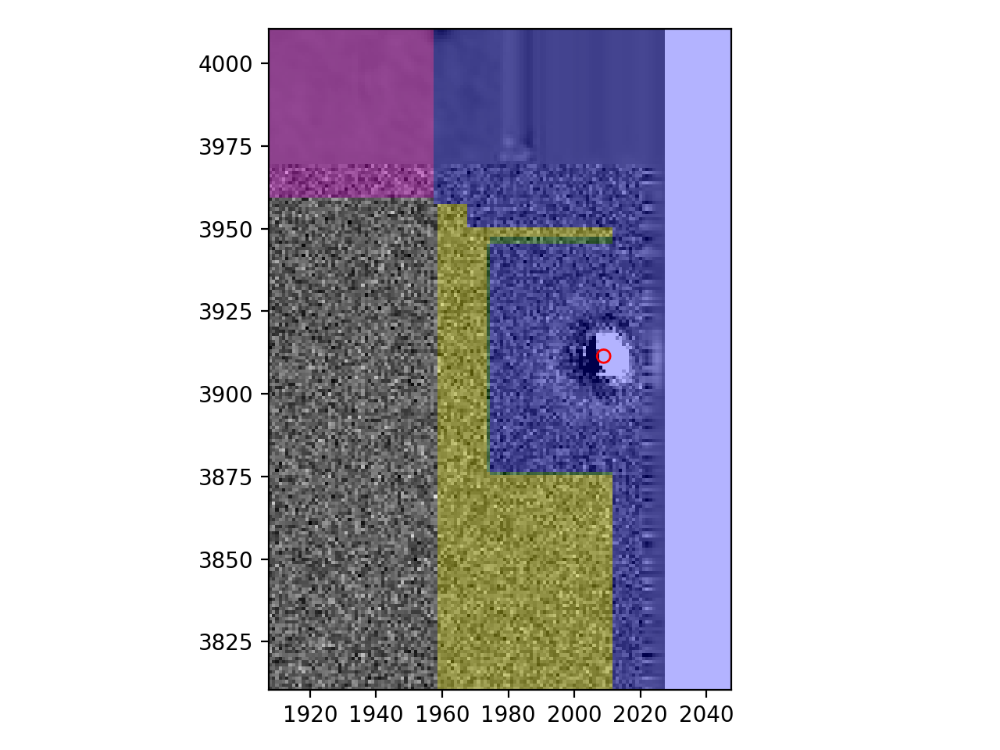

(1908, 3811)
{'visit': 412554, 'ccdnum': 25}


<IPython.core.display.Javascript object>


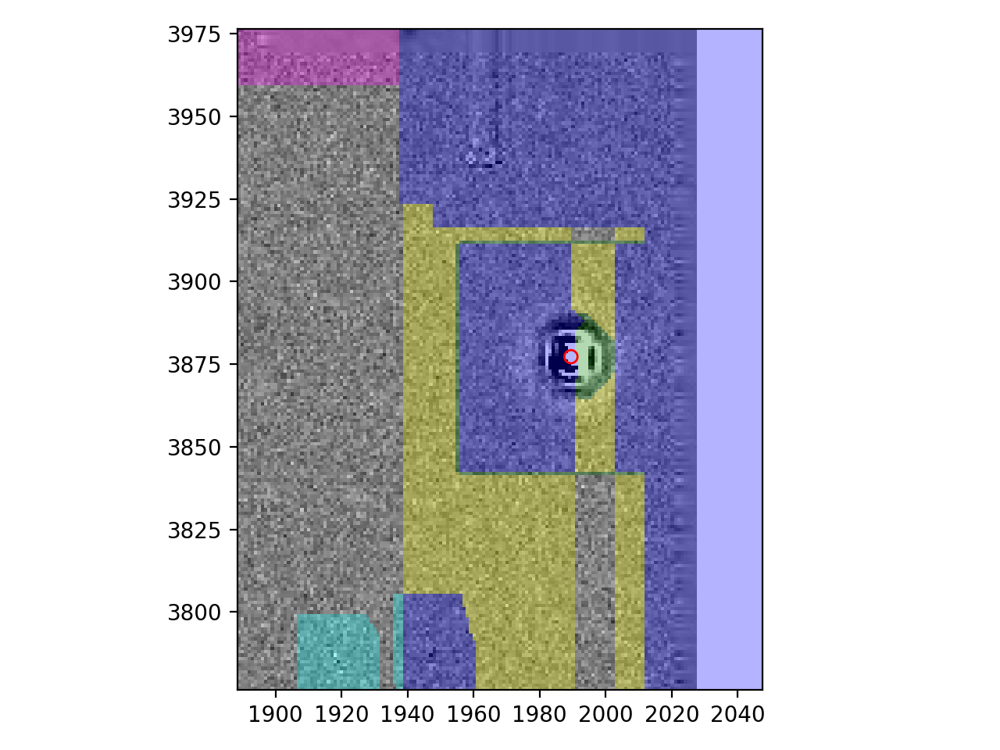

(1889, 3777)
{'visit': 412604, 'ccdnum': 25}


/ssd/lsstsw/stack3_20171021/python/miniconda3-4.3.21/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


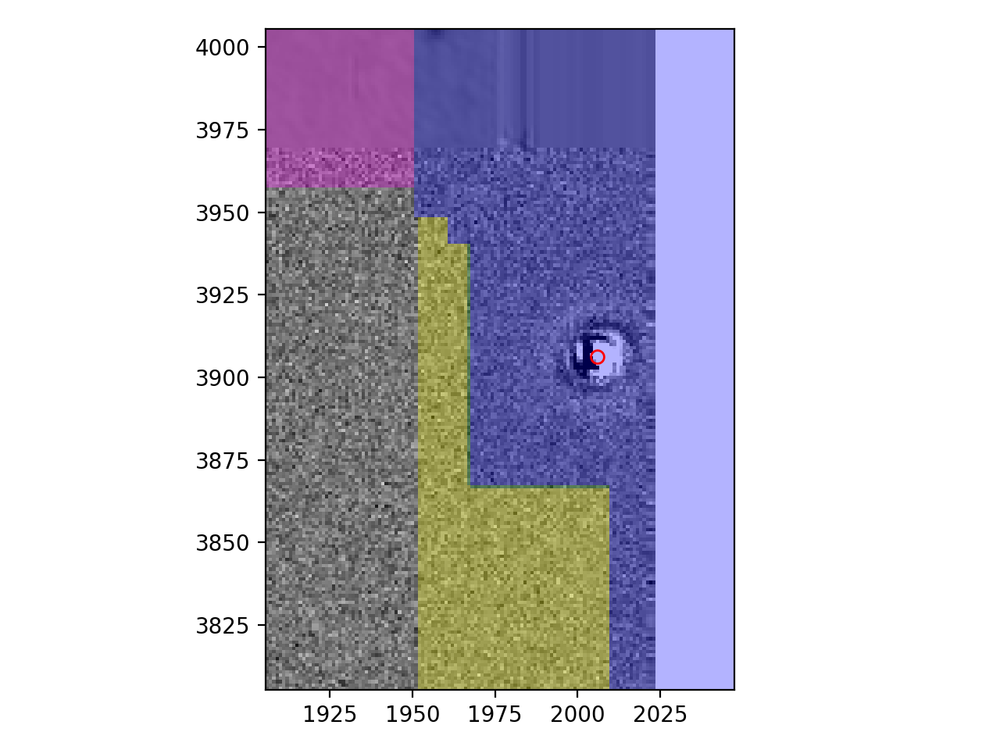

(1906, 3806)
{'visit': 413635, 'ccdnum': 25}


/ssd/lsstsw/stack3_20171021/python/miniconda3-4.3.21/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


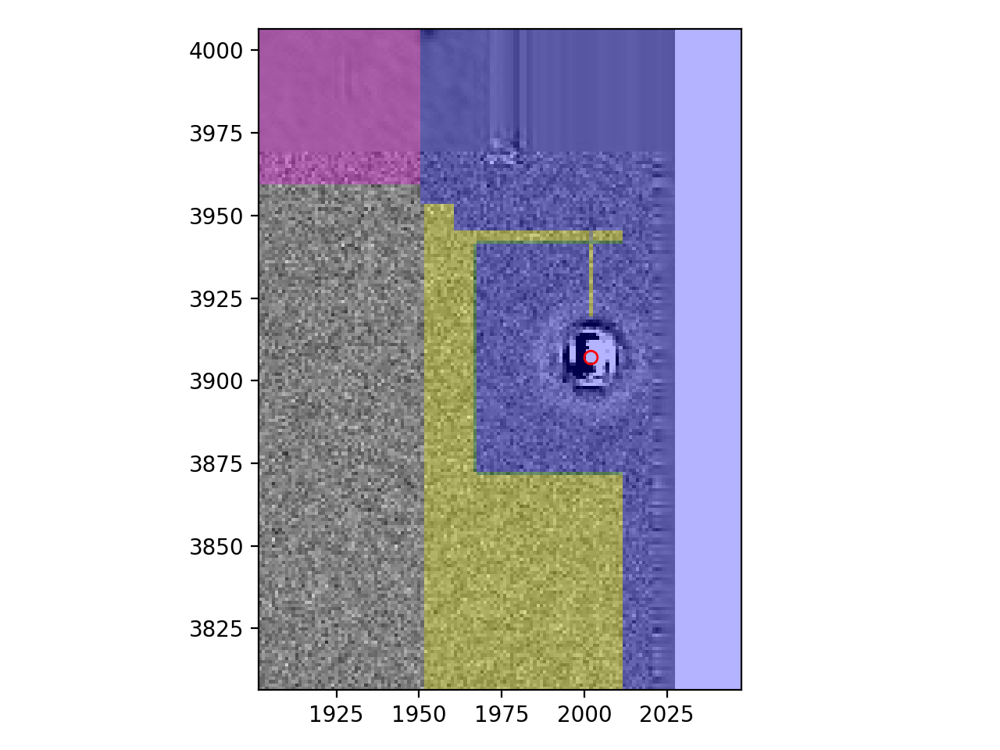

(1902, 3807)
{'visit': 413680, 'ccdnum': 25}


/ssd/lsstsw/stack3_20171021/python/miniconda3-4.3.21/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


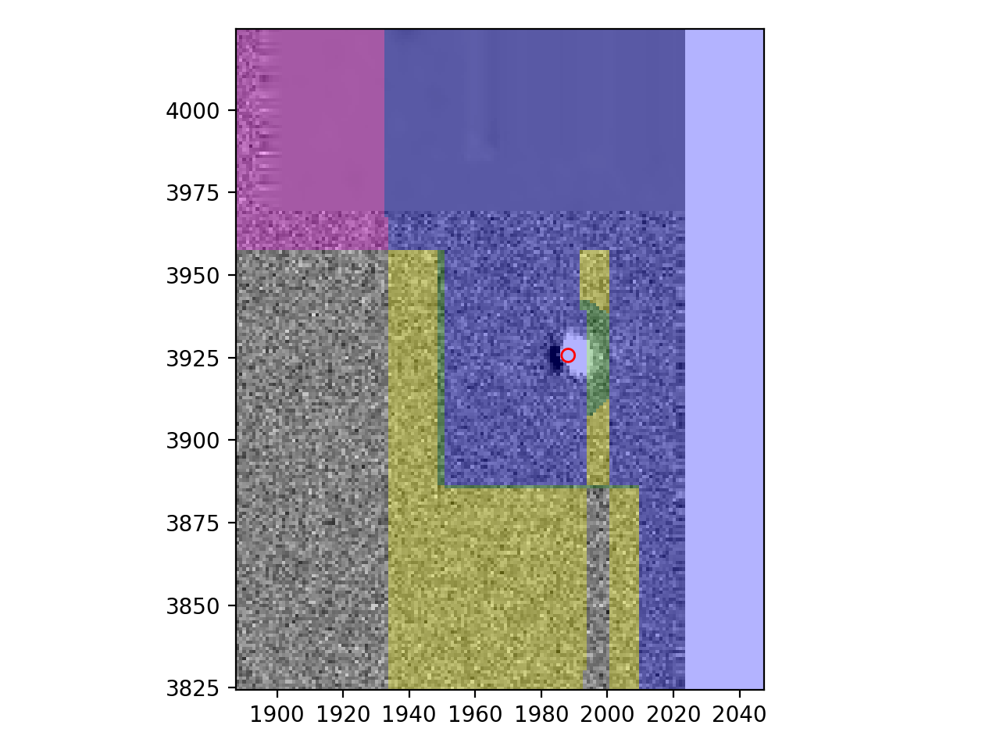

(1888, 3825)
{'visit': 415314, 'ccdnum': 25}


/ssd/lsstsw/stack3_20171021/python/miniconda3-4.3.21/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


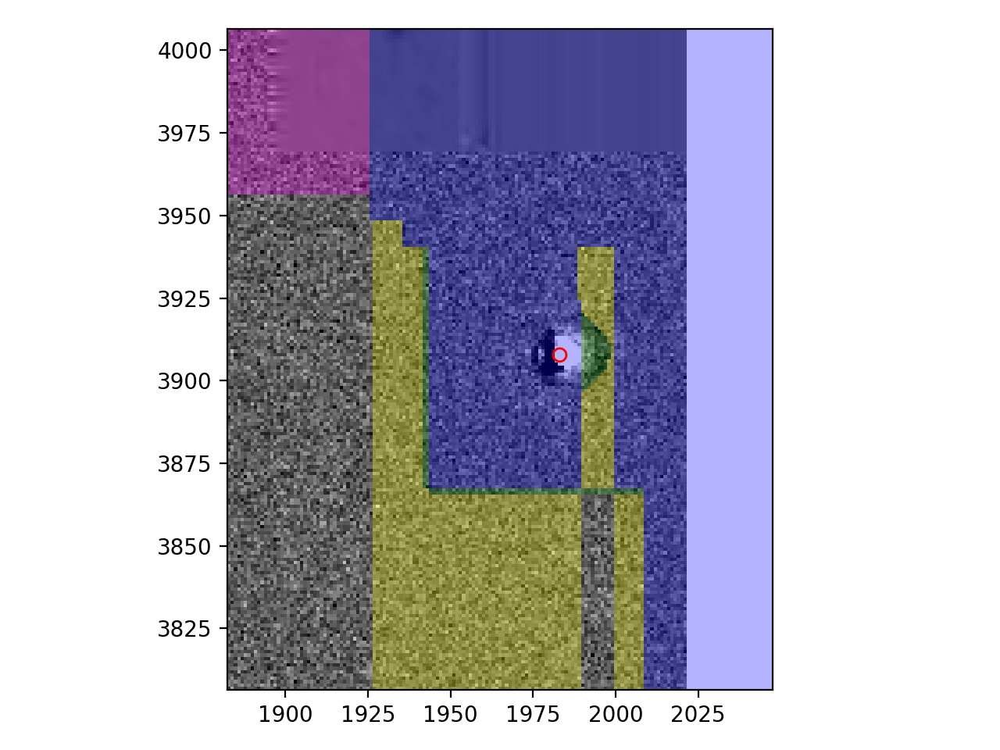

(1883, 3807)
{'visit': 415364, 'ccdnum': 25}


/ssd/lsstsw/stack3_20171021/python/miniconda3-4.3.21/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


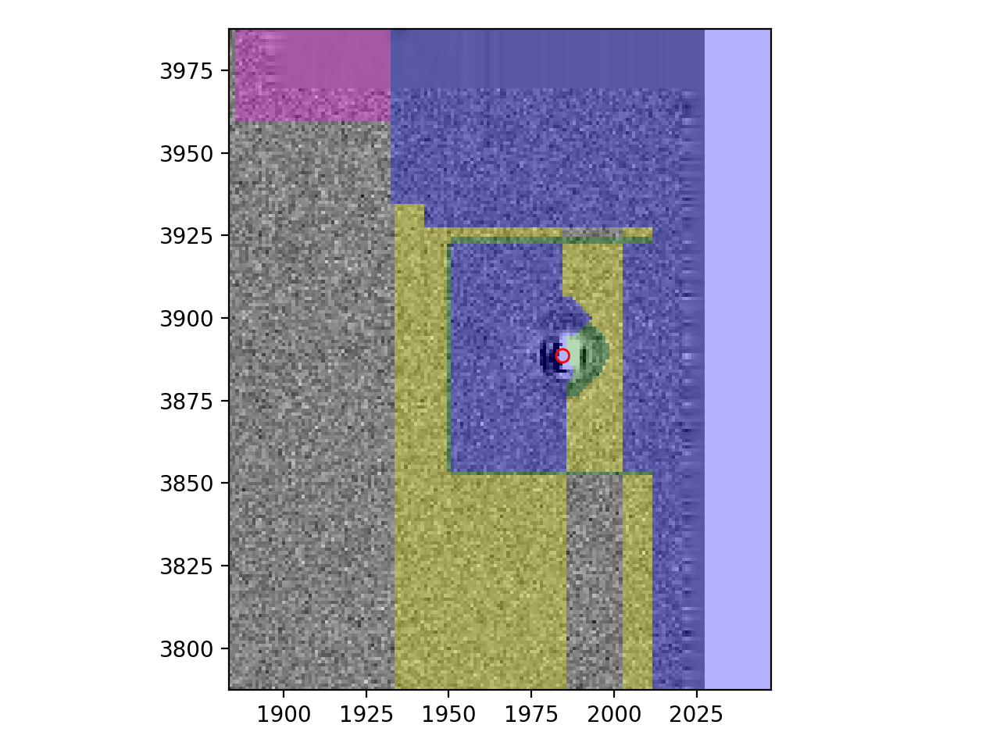

(1884, 3788)
{'visit': 419791, 'ccdnum': 25}


/ssd/lsstsw/stack3_20171021/python/miniconda3-4.3.21/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


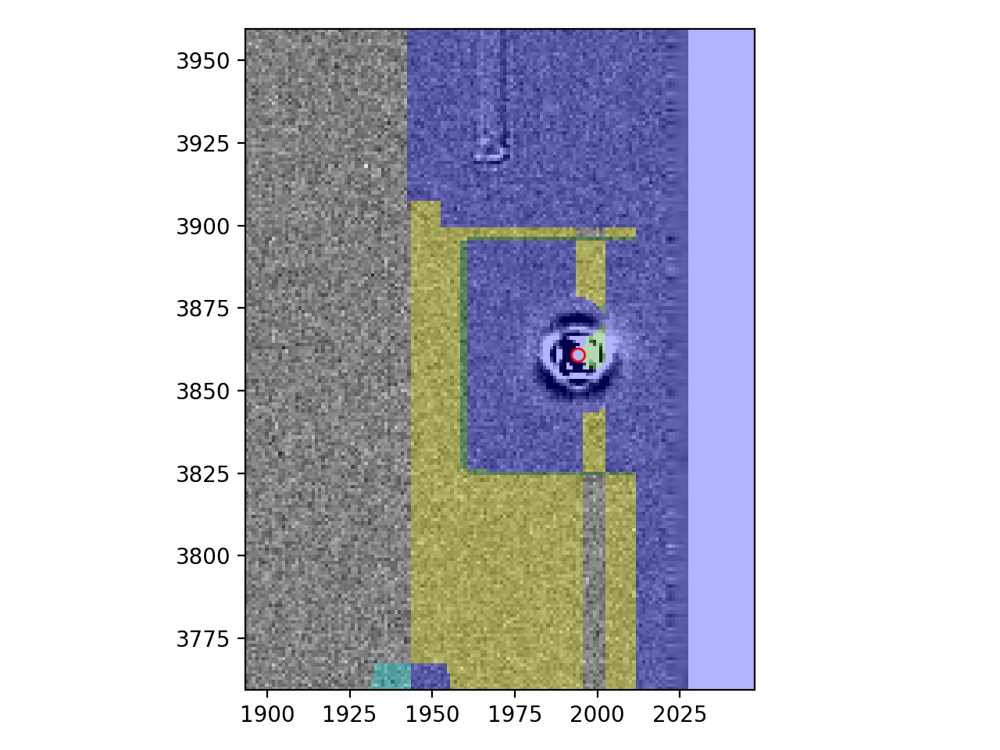

(1894, 3760)
{'visit': 421590, 'ccdnum': 25}


In [8]:
import lsst.afw.geom as afwGeom
import lsst.afw.image as afwImage
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend('matplotlib')

objId = 176486756017766526  # maybe not garbage
#objId = 181071783930101899  # garbage region
srcIds = getSourcesFromObject(objId)
dataIds = [getDataIdFromSrcId(source) for source in srcIds]
coords = objTable.loc[objTable['id'] == objId, ['coord_ra', 'coord_dec']].values

coord = afwGeom.SpherePoint(coords[0][0], coords[0][1], afwGeom.degrees)
width = 200
height = 200
fig = plt.figure()  # combining this or other matplotlib things with disp business below is confusing
for idx, dataId in enumerate(dataIds):
    #fig.add_subplot(3,3,idx+1)
    disp = afwDisplay.Display(idx)
    diffim = butler.get('deepDiff_differenceExp', dataId)
    wcs = diffim.getWcs()
    xy_wcs = wcs.skyToPixel(coord)
    int_X = int(xy_wcs.getX() - width/2) if int(xy_wcs.getX() - width/2) > 0 else 0
    int_Y = int(xy_wcs.getY() - height/2) if int(xy_wcs.getY() - height/2) > 0 else 0
    silly_width = width if (int_X + width) < 2048 else (2048 - int_X)
    silly_height = height if (int_Y + height) < 4096 else (4096 - int_Y)
    silly_extent = afwGeom.Extent2I(silly_width, silly_height)
    xy_wcs_int = afwGeom.Point2I(int_X, int_Y)
    print(xy_wcs_int)
    bbox = afwGeom.Box2I(xy_wcs_int, silly_extent)
    diffimChunk = afwImage.ExposureF(diffim, bbox)
    disp.scale("linear", "zscale")
    disp.mtv(diffimChunk)
    disp.dot('o', xy_wcs[0], xy_wcs[1], ctype='RED')
    print(dataId)

In [10]:
coord.getPosition(afwGeom.radians)
coord.getPosition(afwGeom.degrees)
dataId

{'ccdnum': 25, 'visit': 421590}

In [97]:
# Find a source that is near the region that looks super awful

RA_badarea = 149.7
Dec_badarea = 2.75

coord = afwGeom.SpherePoint(RA_badarea, Dec_badarea, afwGeom.degrees)

In [98]:
objTable.loc[(objTable['coord_ra'] - RA_badarea < 0.01) & (objTable['coord_dec'] - Dec_badarea < 0.01), 'id'].values

array([176486683003323294, 176486683003323295, 176486683003323312, ...,
       181071766750232835, 181071783930101895, 181071783930101899])

In [3]:
def getCutout(exposure, coord, height, width=None):
    """Return a new Exposure that is a small cutout of the original.
    
    Parameters
    ----------
    exposure : `lsst.afw.image.Exposure`
    coord : `lsst.afw.geom.SpherePoint`
        desired center of cutout (e.g., in RA and Dec)
    height : `int`
        height of cutout in pixels
    width : `int`, in pixels
        width of cutout in pixels, default = height
    
    Returns
    -------
    `lsst.afw.image.Exposure`
        The cutout exposure is centered on coord, or centered near coord
        (if coord is within height/2 or width/2 of the exposure edge)
    """
    width = height if width is None else width  # default to square cutout
    wcsPixel = exposure.getWcs().skyToPixel(coord)
    wcsPixel.shift(afwGeom.Extent2D(-width/2, -height/2))  # adjust origin so coord is centered
    bbox = afwGeom.Box2I(afwGeom.Point2I(wcsPixel), afwGeom.Extent2I(width, height))
    bbox.clip(exposure.getBBox())  # ensure new bbox is within original image (may un-center coord somewhat)
    return exposure.Factory(exposure, bbox)

<IPython.core.display.Javascript object>


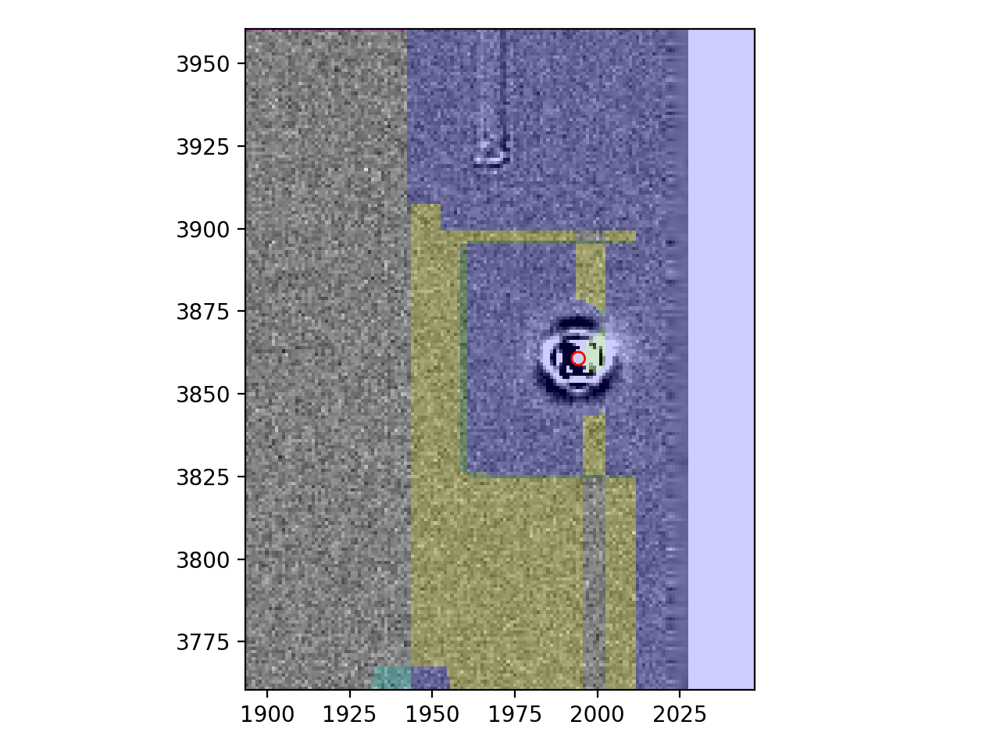

In [4]:
import lsst.afw.geom as afwGeom
import lsst.afw.image as afwImage
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend('matplotlib')
coord = afwGeom.SpherePoint(149.3216739, 2.224109526, afwGeom.degrees)
width = 200
height = 200
#plt.figure(figsize=plt.figaspect(1))
disp = afwDisplay.Display(26)
disp.setMaskTransparency(80)
dataId = {'ccdnum': 25, 'visit': 421590}
diffim = butler.get('deepDiff_differenceExp', dataId)
wcs = diffim.getWcs()
xy_wcs = wcs.skyToPixel(coord)

#int_X = int(xy_wcs.getX() - width/2) if int(xy_wcs.getX() - width/2) > 0 else 0
#int_Y = int(xy_wcs.getY() - height/2) if int(xy_wcs.getY() - height/2) > 0 else 0
#silly_width = width if (int_X + width) < 2048 else (2048 - int_X)
#silly_height = height if (int_Y + height) < 4096 else (4096 - int_Y)
#silly_extent = afwGeom.Extent2I(silly_width, silly_height)
#xy_wcs_int = afwGeom.Point2I(int_X, int_Y)
#bbox = afwGeom.Box2I(xy_wcs_int, silly_extent)

#xy_wcs.shift(afwGeom.Extent2D(-width/2, -height/2))
#bbox = afwGeom.Box2I(afwGeom.Point2I(xy_wcs), afwGeom.Extent2I(width, height))
#exposure_bbox = diffim.getBBox()
#bbox.clip(exposure_bbox)
#diffimChunk = diffim.Factory(diffim, bbox)

diffimChunk = getCutout(diffim, coord, height)

disp.scale('linear', 'zscale')
disp.mtv(diffimChunk)
disp.dot('o', wcs.skyToPixel(coord)[0], wcs.skyToPixel(coord)[1], ctype='RED')

In [5]:
diaSrc = butler.get('deepDiff_diaSrc', dataId)

In [8]:
diaSrc.getSchema()

Schema(
    (Field['L'](name="id", doc="unique ID"), Key<L>(offset=0, nElements=1)),
    (Field['Angle'](name="coord_ra", doc="position in ra/dec"), Key<Angle>(offset=8, nElements=1)),
    (Field['Angle'](name="coord_dec", doc="position in ra/dec"), Key<Angle>(offset=16, nElements=1)),
    (Field['L'](name="parent", doc="unique ID of parent source"), Key<L>(offset=24, nElements=1)),
    (Field['Flag'](name="flags_negative", doc="set if source was detected as significantly negative"), Key['Flag'](offset=32, bit=0)),
    (Field['D'](name="base_GaussianCentroid_x", doc="centroid from Gaussian Centroid algorithm", units="pixel"), Key<D>(offset=40, nElements=1)),
    (Field['D'](name="base_GaussianCentroid_y", doc="centroid from Gaussian Centroid algorithm", units="pixel"), Key<D>(offset=48, nElements=1)),
    (Field['Flag'](name="base_GaussianCentroid_flag", doc="General Failure Flag"), Key['Flag'](offset=32, bit=1)),
    (Field['Flag'](name="base_GaussianCentroid_flag_noPeak", doc="Fitted

<IPython.core.display.Javascript object>


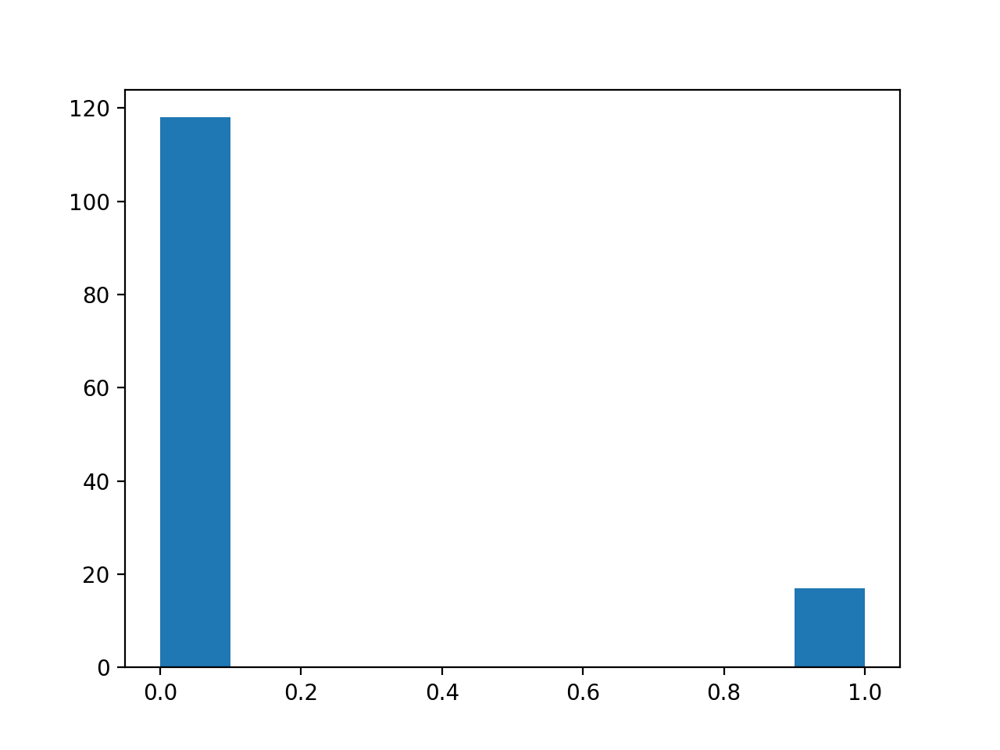

(array([ 118.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,   17.]),
 array([ 0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7,  0.8,  0.9,  1. ]),
 <a list of 10 Patch objects>)

In [12]:
plt.figure()
plt.hist(diaSrc.get('base_PsfFlux_flag'))

In [13]:
dataId

{'ccdnum': 25, 'visit': 421590}

In [14]:
coord

SpherePoint(149.3216739*afwGeom.degrees, 2.224109526*afwGeom.degrees)

In [16]:
coord.offset(bearing=45*afwGeom.degrees, amount=0.02*afwGeom.degrees)

SpherePoint(149.33582683324286*afwGeom.degrees, 2.23825159369518*afwGeom.degrees)